# Face Mask Detection

In [1]:
!pip install xmltodict

## Pre-procesing for ResNet 50 & ResNet 18

### Imports and Setup


In [2]:
import numpy as np 
import pandas as pd 
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import seaborn as sns
from collections import Counter
import os

import torch
import torch.cuda.amp  # For mixed precision training
from torchvision import datasets, transforms, models
from torch.utils.data import Dataset, DataLoader, WeightedRandomSampler
from PIL import Image

import sys
import torch.optim as optim
import torch.nn as nn
import torch.nn.functional as F
import time
import copy
from tqdm import tqdm
from sklearn.metrics import classification_report, confusion_matrix
import os
import shutil
import xml.etree.ElementTree as ET
import random
import xmltodict
from sklearn.model_selection import train_test_split

In [3]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')


### Data Preprocessing and Analysis

In [4]:
img_names = [] 
xml_names = [] 
source_folder="/kaggle/input/face-mask-detection/"
for dirname, _, filenames in os.walk(source_folder):
    for filename in filenames:
        if os.path.join(dirname, filename)[-3:] != "xml":
            img_names.append(filename)
        else:
            xml_names.append(filename)

In [5]:
path_annotations = "/kaggle/input/face-mask-detection/annotations/" 
path_image = "/kaggle/input/face-mask-detection/images/"
listing = []
for i in img_names[:]:
    with open(path_annotations + i[:-4] + ".xml") as fd:
        doc = xmltodict.parse(fd.read())
    temp = doc["annotation"]["object"]
    if type(temp) == list:
        for i in range(len(temp)):
            listing.append(temp[i]["name"])
    else:
        listing.append(temp["name"])
        
Items = Counter(listing).keys()
values = Counter(listing).values()
print(Items, '\n', values)

dict_keys(['with_mask', 'mask_weared_incorrect', 'without_mask']) 
 dict_values([3232, 123, 717])


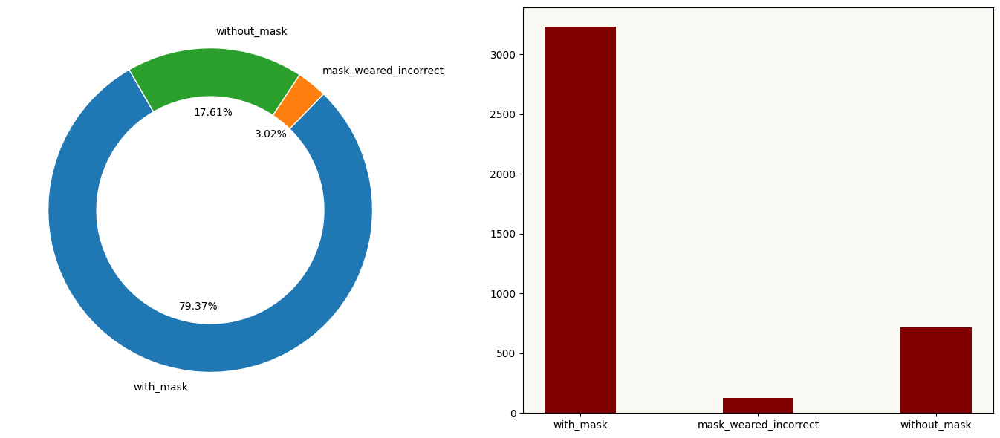

Class distribution:
with_mask: 3232 samples
mask_weared_incorrect: 123 samples
without_mask: 717 samples


In [6]:
# Visualize class distribution
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 6))
background_color = '#faf9f4'
ax1.set_facecolor(background_color)
ax2.set_facecolor(background_color) 
ax1.pie(values, wedgeprops=dict(width=0.3, edgecolor='w'),
        labels=Items, radius=1, startangle=120, autopct='%1.2f%%')

ax2 = plt.bar(Items, list(values),
              color='maroon', width=0.4)

plt.tight_layout()
plt.show()

# Print exact class distribution
class_counts = Counter(listing)
print("Class distribution:")
for cls, count in class_counts.items():
    print(f"{cls}: {count} samples")

In [7]:
options = {"with_mask": 0, "without_mask": 1, "mask_weared_incorrect": 2}

### Data Loading, Augmentation and Splitting


In [8]:
def dataset_creation(image_list): 
    image_tensor = []
    label_tensor = []
    for i, j in enumerate(image_list):
        with open(path_annotations + j[:-4] + ".xml") as fd:
            doc = xmltodict.parse(fd.read())
        if type(doc["annotation"]["object"]) != list:
            temp = doc["annotation"]["object"]
            x, y, w, h = list(map(int, temp["bndbox"].values()))
            label = options[temp["name"]]
            image = Image.open(path_image + j).convert("RGB")
            # Store original image and bbox info
            image_tensor.append((image, (y, x, h-y, w-x), label))
            label_tensor.append(torch.tensor(label))
        else:
            temp = doc["annotation"]["object"]
            for k in range(len(temp)):
                x, y, w, h = list(map(int, temp[k]["bndbox"].values()))
                label = options[temp[k]["name"]]
                image = Image.open(path_image + j).convert("RGB")
                # Store original image and bbox info
                image_tensor.append((image, (y, x, h-y, w-x), label))
                label_tensor.append(torch.tensor(label))
                
    return image_tensor, label_tensor

# Create the raw dataset
raw_images, labels = dataset_creation(img_names)

In [9]:
class FaceMaskDataset(Dataset):
    def __init__(self, images, transform=None):
        self.images = images
        self.transform = transform
        
    def __len__(self):
        return len(self.images)
    
    def __getitem__(self, idx):
        img, bbox, label = self.images[idx]
        y, x, h, w = bbox
        
        # Crop the face region
        face = transforms.functional.crop(img, y, x, h, w)
        
        # Apply transformations
        if self.transform:
            face = self.transform(face)
            
        return face, label

# Define enhanced data augmentation
data_transforms = {
    'train': transforms.Compose([
        transforms.Resize((226, 226)),
        transforms.RandomHorizontalFlip(p=0.5),
        transforms.RandomRotation(15),
        transforms.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.1, hue=0.1),
        transforms.RandomAffine(degrees=0, translate=(0.1, 0.1), scale=(0.9, 1.1)),
        transforms.RandomPerspective(distortion_scale=0.1, p=0.2),
        transforms.ToTensor(),
        transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
    ]),
    'val': transforms.Compose([
        transforms.Resize((226, 226)),
        transforms.ToTensor(),
        transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
    ]),
    'test': transforms.Compose([
        transforms.Resize((226, 226)),
        transforms.ToTensor(),
        transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
    ])
}

In [10]:
# Split the dataset into train, validation, and test sets
train_val_images, test_images = train_test_split(
    raw_images, test_size=0.15, random_state=42, 
    stratify=[img[2] for img in raw_images]  # Stratify by label
)

train_images, val_images = train_test_split(
    train_val_images, test_size=0.15, random_state=42,
    stratify=[img[2] for img in train_val_images]  # Stratify by label
)

# Create dataset objects
train_dataset = FaceMaskDataset(train_images, transform=data_transforms['train'])
val_dataset = FaceMaskDataset(val_images, transform=data_transforms['val'])
test_dataset = FaceMaskDataset(test_images, transform=data_transforms['test'])

# Print statistics
print(f'Total dataset size: {len(raw_images)}')
print(f'Training set size: {len(train_images)}')
print(f'Validation set size: {len(val_images)}')
print(f'Test set size: {len(test_images)}')

# Calculate class weights for weighted sampling
labels_train = [img[2] for img in train_images]
class_sample_count = np.array([labels_train.count(i) for i in range(3)])
print("Class distribution in training set:", class_sample_count)

# Calculate weights
weight = 1. / class_sample_count
samples_weight = np.array([weight[t] for t in labels_train])
samples_weight = torch.from_numpy(samples_weight)
samples_weight = samples_weight.double()

# Create weighted sampler for training set
sampler = WeightedRandomSampler(
    weights=samples_weight,
    num_samples=len(samples_weight),
    replacement=True
)

# Create data loaders
batch_size = 32

train_dataloader = DataLoader(
    train_dataset, 
    batch_size=batch_size, 
    sampler=sampler,  # Use the weighted sampler
    num_workers=4
)

val_dataloader = DataLoader(
    val_dataset, 
    batch_size=batch_size, 
    shuffle=False, 
    num_workers=4
)

test_dataloader = DataLoader(
    test_dataset, 
    batch_size=batch_size, 
    shuffle=False, 
    num_workers=4
)

dataloaders = {
    'train': train_dataloader,
    'val': val_dataloader,
    'test': test_dataloader
}

dataset_sizes = {
    'train': len(train_dataset),
    'val': len(val_dataset),
    'test': len(test_dataset)
}

# Set device
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f"Using device: {device}")

Total dataset size: 4072
Training set size: 2941
Validation set size: 520
Test set size: 611
Class distribution in training set: [2334  518   89]
Using device: cuda


### Focal Loss and Necessary functions

In [11]:
class FocalLoss(nn.Module):
    def __init__(self, alpha=None, gamma=2, reduction='mean'):
        super(FocalLoss, self).__init__()
        self.gamma = gamma
        self.reduction = reduction
        
        # If alpha is provided, create weights tensor
        if alpha is not None:
            self.alpha = torch.tensor(alpha).to(device)
        else:
            self.alpha = None
            
    def forward(self, inputs, targets):
        ce_loss = F.cross_entropy(inputs, targets, reduction='none', weight=self.alpha)
        pt = torch.exp(-ce_loss)
        focal_loss = (1 - pt) ** self.gamma * ce_loss
        
        if self.reduction == 'mean':
            return focal_loss.mean()
        elif self.reduction == 'sum':
            return focal_loss.sum()
        else:
            return focal_loss

### Model for ResNet 50 & ResNet 18

In [12]:
def create_improved_model(model_name='resnet50', num_classes=3, pretrained=True):
    """
    Create an improved model with a more sophisticated architecture
    """
    if model_name == 'resnet50':
        if pretrained:
            model = models.resnet50(weights=models.ResNet50_Weights.DEFAULT)
        else:
            model = models.resnet50(weights=None)
    elif model_name == 'resnet18':
        if pretrained:
            model = models.resnet18(weights=models.ResNet18_Weights.DEFAULT)
        else:
            model = models.resnet18(weights=None)
    else:
        raise ValueError(f"Unsupported model: {model_name}")
    
    # Freeze all layers initially
    for param in model.parameters():
        param.requires_grad = False
    
    # Replace the classifier head
    if model_name.startswith('resnet'):
        num_ftrs = model.fc.in_features
        model.fc = nn.Sequential(
            nn.Linear(num_ftrs, 512),
            nn.BatchNorm1d(512),
            nn.ReLU(inplace=True),
            nn.Dropout(0.5),
            nn.Linear(512, 256),
            nn.BatchNorm1d(256),
            nn.ReLU(inplace=True),
            nn.Dropout(0.4),
            nn.Linear(256, num_classes)
        )

    return model

def unfreeze_model_layers(model, epoch, max_epochs, model_name='resnet50'):
    """
    Progressively unfreeze layers as training progresses
    """
    if model_name.startswith('resnet'):
        if epoch == 0:
            # Only train the custom head for the first epoch
            for param in model.parameters():
                param.requires_grad = False
            for param in model.fc.parameters():
                param.requires_grad = True
                
        elif epoch == int(max_epochs * 0.25):  # After 25% of training
            # Unfreeze layer4
            print("Unfreezing layer4...")
            for param in model.layer4.parameters():
                param.requires_grad = True
                
        elif epoch == int(max_epochs * 0.5):  # After 50% of training
            # Unfreeze layer3
            print("Unfreezing layer3...")
            for param in model.layer3.parameters():
                param.requires_grad = True
                
        elif epoch == int(max_epochs * 0.75):  # After 75% of training
            # Unfreeze layer2
            print("Unfreezing layer2...")
            for param in model.layer2.parameters():
                param.requires_grad = True

    
    # Print the number of trainable parameters
    trainable_params = sum(p.numel() for p in model.parameters() if p.requires_grad)
    total_params = sum(p.numel() for p in model.parameters())
    print(f"Trainable parameters: {trainable_params:,} / {total_params:,} ({trainable_params/total_params:.2%})")
    
    return model

def create_optimizer_with_layer_groups(model, model_name='resnet50', base_lr=0.001):
    """
    Create an optimizer with different learning rates for different layer groups
    """
    if model_name.startswith('resnet'):
        params = [
            {'params': model.fc.parameters(), 'lr': base_lr},
        ]
        
        # Add other layers with lower learning rates if they're unfrozen
        if any(p.requires_grad for p in model.layer4.parameters()):
            params.append({'params': model.layer4.parameters(), 'lr': base_lr * 0.1})
            
        if any(p.requires_grad for p in model.layer3.parameters()):
            params.append({'params': model.layer3.parameters(), 'lr': base_lr * 0.01})
            
        if any(p.requires_grad for p in model.layer2.parameters()):
            params.append({'params': model.layer2.parameters(), 'lr': base_lr * 0.001})
    
    elif model_name.startswith('efficientnet'):
        params = [
            {'params': model.classifier.parameters(), 'lr': base_lr},
        ]
        
        # Add feature blocks with decreasing learning rates
        for i in range(len(model.features)-1, -1, -1):
            if any(p.requires_grad for p in model.features[i].parameters()):
                lr_factor = 0.1 ** (len(model.features) - i)
                params.append({'params': model.features[i].parameters(), 'lr': base_lr * lr_factor})
    
    return torch.optim.AdamW(params, lr=base_lr, weight_decay=0.01)

### Train and Evaluate functions

In [13]:
def train_model_improved(model, dataloaders, criterion, optimizer, scheduler=None, 
                         model_name='resnet50', num_epochs=25, device=None, 
                         early_stopping_patience=7):
    if device is None:
        device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
    
    # Move model to device
    model = model.to(device)
    
    # Use mixed precision training if available
    scaler = torch.cuda.amp.GradScaler() if torch.cuda.is_available() else None
    
    # Track best model and metrics
    best_model_wts = copy.deepcopy(model.state_dict())
    best_acc = 0.0
    patience_counter = 0
    
    # Define class names
    class_names = ['with_mask', 'without_mask', 'mask_weared_incorrect']
    
    # Initialize history tracking
    history = {
        'train_loss': [], 'train_acc': [], 'val_loss': [], 'val_acc': [], 'lr': [],
        'class_metrics': {cls: {'train_acc': [], 'val_acc': []} for cls in range(len(class_names))}
    }
    
    since = time.time()
    
    for epoch in range(num_epochs):
        print(f'Epoch {epoch+1}/{num_epochs}')
        print('-' * 40)
        
        # Progressively unfreeze layers
        model = unfreeze_model_layers(model, epoch, num_epochs, model_name)
        
        # Update optimizer with new layer groups when unfreezing
        if epoch in [0, int(num_epochs * 0.25), int(num_epochs * 0.5), int(num_epochs * 0.75)]:
            optimizer = create_optimizer_with_layer_groups(model, model_name, 
                                                          base_lr=0.001 * (0.8 ** (epoch // 5)))
            print(f"Optimizer updated with new learning rates")
            for i, param_group in enumerate(optimizer.param_groups):
                print(f"  Group {i}: lr = {param_group['lr']}")
        
        # Each epoch has a training and validation phase
        for phase in ['train', 'val']:
            if phase == 'train':
                model.train()  # Set model to training mode
            else:
                model.eval()   # Set model to evaluate mode
                
            running_loss = 0.0
            running_corrects = 0
            all_preds = []
            all_labels = []
            
            # Track class-specific metrics
            class_metrics = {cls: {'correct': 0, 'total': 0} for cls in range(len(class_names))}
            
            # Track progress
            pbar = tqdm(dataloaders[phase], desc=phase)
            
            # Iterate over data
            for inputs, labels in pbar:
                inputs = inputs.to(device)
                labels = labels.to(device)
                
                # Zero the parameter gradients
                optimizer.zero_grad()
                
                # Forward pass - track history only in training
                with torch.set_grad_enabled(phase == 'train'):
                    # Use mixed precision for forward pass if in training
                    if phase == 'train' and scaler is not None:
                        with torch.cuda.amp.autocast():
                            outputs = model(inputs)
                            loss = criterion(outputs, labels)
                        
                        # Backward pass with gradient scaling
                        scaler.scale(loss).backward()
                        scaler.step(optimizer)
                        scaler.update()
                    else:
                        # Standard forward pass
                        outputs = model(inputs)
                        loss = criterion(outputs, labels)
                        
                        # Backward + optimize only if in training phase
                        if phase == 'train':
                            loss.backward()
                            optimizer.step()
                
                # Calculate predictions
                _, preds = torch.max(outputs, 1)
                
                # Statistics
                running_loss += loss.item() * inputs.size(0)
                running_corrects += torch.sum(preds == labels.data)
                
                # Store predictions and labels for confusion matrix
                all_preds.extend(preds.cpu().numpy())
                all_labels.extend(labels.cpu().numpy())
                
                # Track class-specific metrics
                for cls in range(len(class_names)):
                    mask = (labels == cls)
                    class_metrics[cls]['total'] += torch.sum(mask).item()
                    if torch.sum(mask).item() > 0:
                        class_metrics[cls]['correct'] += torch.sum((preds == labels.data) & mask).item()
                
                # Update progress bar
                pbar.set_postfix({'loss': loss.item()})
            
            # Calculate epoch metrics
            epoch_loss = running_loss / len(dataloaders[phase].dataset)
            epoch_acc = running_corrects.double() / len(dataloaders[phase].dataset)
            
            # Calculate class-specific accuracies
            class_accuracies = {}
            for cls in range(len(class_names)):
                if class_metrics[cls]['total'] > 0:
                    class_accuracies[cls] = class_metrics[cls]['correct'] / class_metrics[cls]['total']
                else:
                    class_accuracies[cls] = 0.0
                
                # Track class-specific history
                history['class_metrics'][cls][f'{phase}_acc'].append(class_accuracies[cls])
            
            # Print epoch results
            class_acc_str = " | ".join([f"{class_names[cls]}: {class_accuracies[cls]:.4f}" 
                                      for cls in range(len(class_names))])
            print(f'{phase.upper()} Loss: {epoch_loss:.4f} Acc: {epoch_acc:.4f}')
            print(f'Class Accuracies: {class_acc_str}')
            
            # Plot confusion matrix for validation phase
            if phase == 'val' and epoch % 10 == 0:
                cm = confusion_matrix(all_labels, all_preds)
                plt.figure(figsize=(10, 8))
                sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
                           xticklabels=class_names, yticklabels=class_names)
                plt.title(f'Validation Confusion Matrix - Epoch {epoch+1}')
                plt.ylabel('True label')
                plt.xlabel('Predicted label')
                plt.tight_layout()
                plt.show()
            
            # Update history
            if phase == 'train':
                history['train_loss'].append(epoch_loss)
                history['train_acc'].append(epoch_acc.item())
                history['lr'].append(optimizer.param_groups[0]['lr'])
            else:  # validation phase
                history['val_loss'].append(epoch_loss)
                history['val_acc'].append(epoch_acc.item())
                
                # Check if this is the best model so far
                if epoch_acc > best_acc:
                    best_acc = epoch_acc
                    best_model_wts = copy.deepcopy(model.state_dict())
                    patience_counter = 0
                    print(f'✓ New best model saved! Validation Accuracy: {epoch_acc:.4f}')
                else:
                    patience_counter += 1
                    print(f'× No improvement for {patience_counter} epochs.')
                
                # Early stopping check
                if patience_counter >= early_stopping_patience:
                    print(f'Early stopping triggered after {patience_counter} epochs without improvement')
                    break
        
            # Update the scheduler based on validation loss if it's a ReduceLROnPlateau
            if scheduler is not None and phase == 'val':
                if isinstance(scheduler, torch.optim.lr_scheduler.ReduceLROnPlateau):
                    scheduler.step(epoch_loss)
                    current_lr = optimizer.param_groups[0]['lr']
                    print(f"Current learning rate: {current_lr}")
                else:
                    scheduler.step()
                    current_lr = optimizer.param_groups[0]['lr']
                    print(f"Current learning rate: {current_lr}")
        
        print('-' * 40)
        
        # Break out of training loop if early stopping triggered
        if patience_counter >= early_stopping_patience:
            break
                
    time_elapsed = time.time() - since
    print(f'Training complete in {time_elapsed // 60:.0f}m {time_elapsed % 60:.0f}s')
    print(f'Best validation Accuracy: {best_acc:.4f}')
    
    # Plot training history
    plt.figure(figsize=(18, 12))
    
    # Plot loss
    plt.subplot(2, 2, 1)
    plt.plot(history['train_loss'], label='Train Loss')
    plt.plot(history['val_loss'], label='Validation Loss')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.title('Training and Validation Loss')
    plt.legend()
    
    # Plot overall accuracy
    plt.subplot(2, 2, 2)
    plt.plot(history['train_acc'], label='Train Accuracy')
    plt.plot(history['val_acc'], label='Validation Accuracy')
    plt.xlabel('Epoch')
    plt.ylabel('Accuracy')
    plt.title('Training and Validation Accuracy')
    plt.legend()
    
    # Plot learning rate
    plt.subplot(2, 2, 3)
    plt.plot(history['lr'], 'o-')
    plt.xlabel('Epoch')
    plt.ylabel('Learning Rate')
    plt.title('Learning Rate Schedule')
    
    # Plot class-specific accuracy
    plt.subplot(2, 2, 4)
    for cls in range(len(class_names)):
        plt.plot(history['class_metrics'][cls]['val_acc'], 
                 label=f'{class_names[cls]}')
    plt.xlabel('Epoch')
    plt.ylabel('Class Accuracy')
    plt.title('Validation Accuracy by Class')
    plt.legend()
    
    plt.tight_layout()
    plt.show()
    
    # Load best model weights
    model.load_state_dict(best_model_wts)
    
    return model, history

In [14]:
def evaluate_model_on_test(model, test_loader, device=None):
    """
    Evaluate the model on the test dataset and return metrics
    """
    if device is None:
        device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
    
    model.eval()
    correct = 0
    total = 0
    all_preds = []
    all_labels = []
    
    with torch.no_grad():
        for images, labels in test_loader:
            images, labels = images.to(device), labels.to(device)
            outputs = model(images)
            _, predicted = torch.max(outputs.data, 1)
            
            total += labels.size(0)
            correct += (predicted == labels).sum().item()
            
            all_preds.extend(predicted.cpu().numpy())
            all_labels.extend(labels.cpu().numpy())
    
    accuracy = 100 * correct / total
    
    # Calculate confusion matrix and classification report
    class_names = ['with_mask', 'without_mask', 'mask_weared_incorrect']
    cm = confusion_matrix(all_labels, all_preds)
    cr = classification_report(all_labels, all_preds, target_names=class_names)
    
    print(f'Test Accuracy: {accuracy:.2f}%')
    print('\nConfusion Matrix:')
    print(cm)
    print('\nClassification Report:')
    print(cr)
    
    # Plot confusion matrix
    plt.figure(figsize=(10, 8))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=class_names, yticklabels=class_names)
    plt.title('Confusion Matrix')
    plt.ylabel('True Label')
    plt.xlabel('Predicted Label')
    plt.tight_layout()
    plt.show()
    
    return accuracy, cm, cr

def visualize_test_predictions(model, test_loader, num_images=8, device=None):
    """
    Visualize predictions on test images
    """
    if device is None:
        device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
    
    model.eval()
    
    # Get a batch of test images
    dataiter = iter(test_loader)
    images, labels = next(dataiter)
    
    # Make predictions
    with torch.no_grad():
        outputs = model(images.to(device))
        _, predicted = torch.max(outputs, 1)
        probabilities = F.softmax(outputs, dim=1)
    
    # Convert to numpy for visualization
    images = images.cpu().numpy()
    labels = labels.cpu().numpy()
    predicted = predicted.cpu().numpy()
    probabilities = probabilities.cpu().numpy()
    
    # Plot the images with predictions
    class_names = ['with_mask', 'without_mask', 'mask_weared_incorrect']
    fig = plt.figure(figsize=(15, 12))
    
    for i in range(min(num_images, len(images))):
        ax = plt.subplot(4, 2, i + 1)
        
        # Denormalize the image
        img = images[i].transpose((1, 2, 0))
        mean = np.array([0.485, 0.456, 0.406])
        std = np.array([0.229, 0.224, 0.225])
        img = std * img + mean
        img = np.clip(img, 0, 1)
        
        plt.imshow(img)
        
        true_label = class_names[labels[i]]
        pred_label = class_names[predicted[i]]
        
        # Set color based on correct/incorrect prediction
        color = 'green' if labels[i] == predicted[i] else 'red'
        
        title = f"True: {true_label}\nPred: {pred_label}"
        ax.set_title(title, color=color)
        
        # Add probabilities as text
        probs_text = "\n".join([f"{class_names[j]}: {probabilities[i][j]:.2f}" for j in range(3)])
        plt.xlabel(probs_text, fontsize=9)
        
        plt.axis('off')
    
    plt.tight_layout()
    plt.show()

## ResNet 50 Training

In [15]:
# Initialize model with improved architecture
model_resnet50 = create_improved_model(model_name='resnet50', num_classes=3)
model_resnet50 = model_resnet50.to(device)

# Define loss function (Focal Loss for handling class imbalance)
criterion = FocalLoss(gamma=2)  # Higher gamma gives more weight to hard examples

# Define optimizer with weight decay for regularization
optimizer = create_optimizer_with_layer_groups(model_resnet50, model_name='resnet50', base_lr=0.001)

# Define learning rate scheduler with cosine annealing and warm restarts
scheduler = torch.optim.lr_scheduler.CosineAnnealingWarmRestarts(
    optimizer, 
    T_0=5,  # Restart every 5 epochs
    T_mult=2,  # Double the restart interval after each restart
    eta_min=1e-6  # Minimum learning rate
)

# Print summary of the model
print(model_resnet50)

Downloading: "https://download.pytorch.org/models/resnet50-11ad3fa6.pth" to /root/.cache/torch/hub/checkpoints/resnet50-11ad3fa6.pth
100%|██████████| 97.8M/97.8M [00:00<00:00, 235MB/s]


ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): Bottleneck(
      (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (downsample): Sequential(
        (0): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 

<ipython-input-13-3b48f1ece74f>:11: FutureWarning: `torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.
  scaler = torch.cuda.amp.GradScaler() if torch.cuda.is_available() else None


Epoch 1/30
----------------------------------------
Trainable parameters: 1,182,723 / 24,690,755 (4.79%)
Optimizer updated with new learning rates
  Group 0: lr = 0.001


train:   0%|          | 0/92 [00:00<?, ?it/s]<ipython-input-13-3b48f1ece74f>:74: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast():
train: 100%|██████████| 92/92 [00:11<00:00,  7.97it/s, loss=0.542]


TRAIN Loss: 0.3861 Acc: 0.5848
Class Accuracies: with_mask: 0.5556 | without_mask: 0.7029 | mask_weared_incorrect: 0.4799


val: 100%|██████████| 17/17 [00:01<00:00, 10.79it/s, loss=0.228]


VAL Loss: 0.2239 Acc: 0.8077
Class Accuracies: with_mask: 0.8232 | without_mask: 0.8571 | mask_weared_incorrect: 0.1250


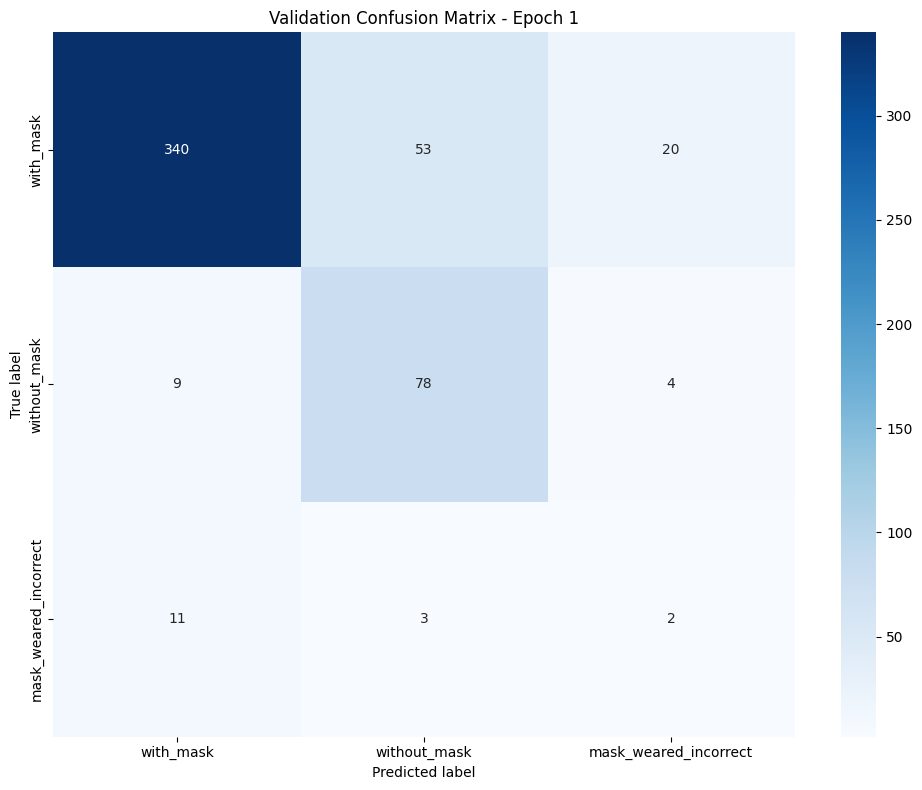

✓ New best model saved! Validation Accuracy: 0.8077
Current learning rate: 0.001
----------------------------------------
Epoch 2/30
----------------------------------------
Trainable parameters: 1,182,723 / 24,690,755 (4.79%)


train:   0%|          | 0/92 [00:00<?, ?it/s]<ipython-input-13-3b48f1ece74f>:74: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast():
train: 100%|██████████| 92/92 [00:11<00:00,  8.33it/s, loss=0.196]


TRAIN Loss: 0.2822 Acc: 0.6902
Class Accuracies: with_mask: 0.6858 | without_mask: 0.7632 | mask_weared_incorrect: 0.6190


val: 100%|██████████| 17/17 [00:01<00:00, 11.39it/s, loss=0.156]


VAL Loss: 0.3019 Acc: 0.6846
Class Accuracies: with_mask: 0.6513 | without_mask: 0.8791 | mask_weared_incorrect: 0.4375
× No improvement for 1 epochs.
Current learning rate: 0.001
----------------------------------------
Epoch 3/30
----------------------------------------
Trainable parameters: 1,182,723 / 24,690,755 (4.79%)


train: 100%|██████████| 92/92 [00:11<00:00,  7.98it/s, loss=0.144]


TRAIN Loss: 0.2454 Acc: 0.7202
Class Accuracies: with_mask: 0.7199 | without_mask: 0.7876 | mask_weared_incorrect: 0.6541


val: 100%|██████████| 17/17 [00:01<00:00, 11.04it/s, loss=0.349]


VAL Loss: 0.1768 Acc: 0.8115
Class Accuracies: with_mask: 0.8692 | without_mask: 0.6374 | mask_weared_incorrect: 0.3125
✓ New best model saved! Validation Accuracy: 0.8115
Current learning rate: 0.001
----------------------------------------
Epoch 4/30
----------------------------------------
Trainable parameters: 1,182,723 / 24,690,755 (4.79%)


train: 100%|██████████| 92/92 [00:10<00:00,  8.44it/s, loss=0.279]


TRAIN Loss: 0.2189 Acc: 0.7548
Class Accuracies: with_mask: 0.7454 | without_mask: 0.8178 | mask_weared_incorrect: 0.7011


val: 100%|██████████| 17/17 [00:01<00:00, 11.51it/s, loss=0.149]


VAL Loss: 0.2362 Acc: 0.7404
Class Accuracies: with_mask: 0.7240 | without_mask: 0.9011 | mask_weared_incorrect: 0.2500
× No improvement for 1 epochs.
Current learning rate: 0.001
----------------------------------------
Epoch 5/30
----------------------------------------
Trainable parameters: 1,182,723 / 24,690,755 (4.79%)


train: 100%|██████████| 92/92 [00:11<00:00,  7.99it/s, loss=0.104]


TRAIN Loss: 0.2222 Acc: 0.7576
Class Accuracies: with_mask: 0.7530 | without_mask: 0.8291 | mask_weared_incorrect: 0.6854


val: 100%|██████████| 17/17 [00:01<00:00, 11.54it/s, loss=0.225]


VAL Loss: 0.2458 Acc: 0.7000
Class Accuracies: with_mask: 0.7046 | without_mask: 0.6923 | mask_weared_incorrect: 0.6250
× No improvement for 2 epochs.
Current learning rate: 0.001
----------------------------------------
Epoch 6/30
----------------------------------------
Trainable parameters: 1,182,723 / 24,690,755 (4.79%)


train: 100%|██████████| 92/92 [00:11<00:00,  8.35it/s, loss=0.175] 


TRAIN Loss: 0.2095 Acc: 0.7708
Class Accuracies: with_mask: 0.7720 | without_mask: 0.8288 | mask_weared_incorrect: 0.7052


val: 100%|██████████| 17/17 [00:01<00:00, 11.53it/s, loss=0.267]


VAL Loss: 0.2854 Acc: 0.6596
Class Accuracies: with_mask: 0.6199 | without_mask: 0.8571 | mask_weared_incorrect: 0.5625
× No improvement for 3 epochs.
Current learning rate: 0.001
----------------------------------------
Epoch 7/30
----------------------------------------
Trainable parameters: 1,182,723 / 24,690,755 (4.79%)


train: 100%|██████████| 92/92 [00:11<00:00,  8.24it/s, loss=0.225] 


TRAIN Loss: 0.1838 Acc: 0.7956
Class Accuracies: with_mask: 0.7903 | without_mask: 0.8407 | mask_weared_incorrect: 0.7576


val: 100%|██████████| 17/17 [00:01<00:00, 11.48it/s, loss=0.259]


VAL Loss: 0.2598 Acc: 0.7058
Class Accuracies: with_mask: 0.6804 | without_mask: 0.8242 | mask_weared_incorrect: 0.6875
× No improvement for 4 epochs.
Current learning rate: 0.001
----------------------------------------
Epoch 8/30
----------------------------------------
Unfreezing layer4...
Trainable parameters: 16,147,459 / 24,690,755 (65.40%)
Optimizer updated with new learning rates
  Group 0: lr = 0.0008
  Group 1: lr = 8e-05


train: 100%|██████████| 92/92 [00:11<00:00,  7.68it/s, loss=0.0634]


TRAIN Loss: 0.1596 Acc: 0.8300
Class Accuracies: with_mask: 0.8117 | without_mask: 0.8835 | mask_weared_incorrect: 0.7934


val: 100%|██████████| 17/17 [00:01<00:00, 11.58it/s, loss=0.0728]


VAL Loss: 0.1510 Acc: 0.8346
Class Accuracies: with_mask: 0.8184 | without_mask: 0.9341 | mask_weared_incorrect: 0.6875
✓ New best model saved! Validation Accuracy: 0.8346
Current learning rate: 0.0008
----------------------------------------
Epoch 9/30
----------------------------------------
Trainable parameters: 16,147,459 / 24,690,755 (65.40%)


train: 100%|██████████| 92/92 [00:11<00:00,  8.04it/s, loss=0.0814]


TRAIN Loss: 0.0978 Acc: 0.8909
Class Accuracies: with_mask: 0.8739 | without_mask: 0.9242 | mask_weared_incorrect: 0.8767


val: 100%|██████████| 17/17 [00:01<00:00, 11.36it/s, loss=0.225] 


VAL Loss: 0.0977 Acc: 0.9019
Class Accuracies: with_mask: 0.9225 | without_mask: 0.8791 | mask_weared_incorrect: 0.5000
✓ New best model saved! Validation Accuracy: 0.9019
Current learning rate: 0.0008
----------------------------------------
Epoch 10/30
----------------------------------------
Trainable parameters: 16,147,459 / 24,690,755 (65.40%)


train: 100%|██████████| 92/92 [00:11<00:00,  7.72it/s, loss=0.0776]


TRAIN Loss: 0.0809 Acc: 0.9126
Class Accuracies: with_mask: 0.8970 | without_mask: 0.9361 | mask_weared_incorrect: 0.9051


val: 100%|██████████| 17/17 [00:01<00:00, 11.36it/s, loss=0.26]  


VAL Loss: 0.0964 Acc: 0.9096
Class Accuracies: with_mask: 0.9249 | without_mask: 0.8791 | mask_weared_incorrect: 0.6875
✓ New best model saved! Validation Accuracy: 0.9096
Current learning rate: 0.0008
----------------------------------------
Epoch 11/30
----------------------------------------
Trainable parameters: 16,147,459 / 24,690,755 (65.40%)


train: 100%|██████████| 92/92 [00:11<00:00,  8.08it/s, loss=0.0555]


TRAIN Loss: 0.0716 Acc: 0.9215
Class Accuracies: with_mask: 0.8949 | without_mask: 0.9531 | mask_weared_incorrect: 0.9164


val: 100%|██████████| 17/17 [00:01<00:00, 11.32it/s, loss=0.0578]


VAL Loss: 0.0837 Acc: 0.9154
Class Accuracies: with_mask: 0.9274 | without_mask: 0.9121 | mask_weared_incorrect: 0.6250


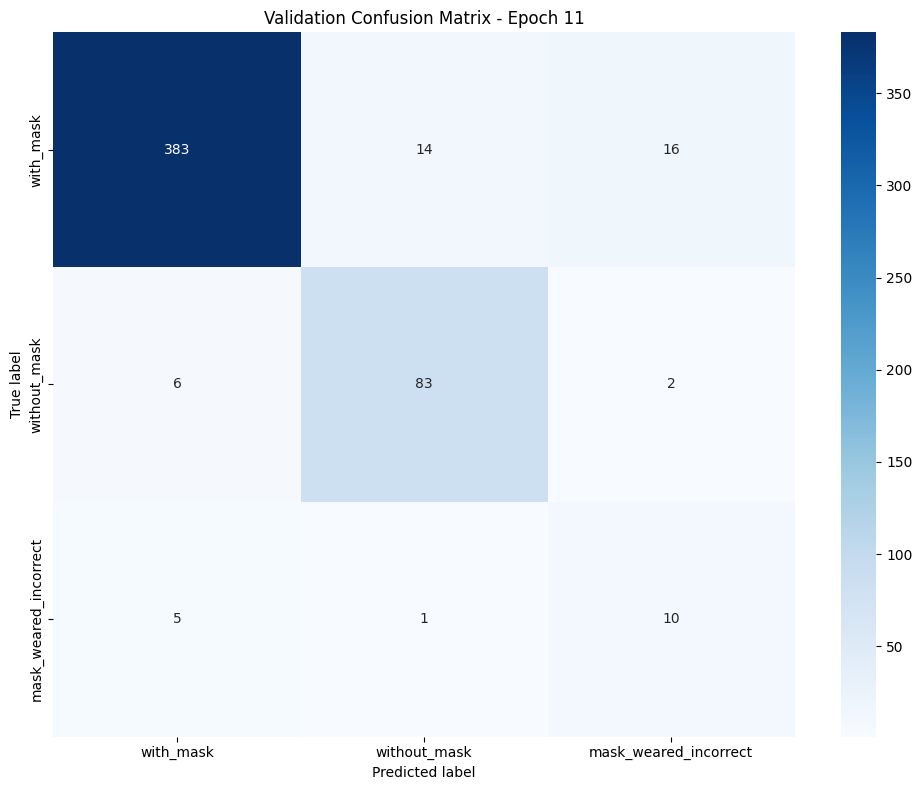

✓ New best model saved! Validation Accuracy: 0.9154
Current learning rate: 0.0008
----------------------------------------
Epoch 12/30
----------------------------------------
Trainable parameters: 16,147,459 / 24,690,755 (65.40%)


train:   0%|          | 0/92 [00:00<?, ?it/s]<ipython-input-13-3b48f1ece74f>:74: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast():
train: 100%|██████████| 92/92 [00:11<00:00,  8.09it/s, loss=0.0399] 


TRAIN Loss: 0.0537 Acc: 0.9374
Class Accuracies: with_mask: 0.9262 | without_mask: 0.9546 | mask_weared_incorrect: 0.9318


val: 100%|██████████| 17/17 [00:01<00:00, 11.26it/s, loss=0.156] 


VAL Loss: 0.0757 Acc: 0.9212
Class Accuracies: with_mask: 0.9322 | without_mask: 0.9231 | mask_weared_incorrect: 0.6250
✓ New best model saved! Validation Accuracy: 0.9212
Current learning rate: 0.0008
----------------------------------------
Epoch 13/30
----------------------------------------
Trainable parameters: 16,147,459 / 24,690,755 (65.40%)


train: 100%|██████████| 92/92 [00:12<00:00,  7.65it/s, loss=0.00883]


TRAIN Loss: 0.0463 Acc: 0.9449
Class Accuracies: with_mask: 0.9266 | without_mask: 0.9616 | mask_weared_incorrect: 0.9483


val: 100%|██████████| 17/17 [00:01<00:00, 11.10it/s, loss=0.034] 


VAL Loss: 0.0897 Acc: 0.9038
Class Accuracies: with_mask: 0.9128 | without_mask: 0.9121 | mask_weared_incorrect: 0.6250
× No improvement for 1 epochs.
Current learning rate: 0.0008
----------------------------------------
Epoch 14/30
----------------------------------------
Trainable parameters: 16,147,459 / 24,690,755 (65.40%)


train: 100%|██████████| 92/92 [00:11<00:00,  8.08it/s, loss=0.00401]


TRAIN Loss: 0.0356 Acc: 0.9578
Class Accuracies: with_mask: 0.9444 | without_mask: 0.9721 | mask_weared_incorrect: 0.9576


val: 100%|██████████| 17/17 [00:01<00:00, 11.42it/s, loss=0.191] 


VAL Loss: 0.0631 Acc: 0.9365
Class Accuracies: with_mask: 0.9564 | without_mask: 0.9121 | mask_weared_incorrect: 0.5625
✓ New best model saved! Validation Accuracy: 0.9365
Current learning rate: 0.0008
----------------------------------------
Epoch 15/30
----------------------------------------
Trainable parameters: 16,147,459 / 24,690,755 (65.40%)


train: 100%|██████████| 92/92 [00:12<00:00,  7.65it/s, loss=0.0873] 


TRAIN Loss: 0.0376 Acc: 0.9643
Class Accuracies: with_mask: 0.9498 | without_mask: 0.9758 | mask_weared_incorrect: 0.9682


val: 100%|██████████| 17/17 [00:01<00:00, 11.28it/s, loss=0.249] 


VAL Loss: 0.0629 Acc: 0.9308
Class Accuracies: with_mask: 0.9492 | without_mask: 0.9011 | mask_weared_incorrect: 0.6250
× No improvement for 1 epochs.
Current learning rate: 0.0008
----------------------------------------
Epoch 16/30
----------------------------------------
Unfreezing layer3...
Trainable parameters: 23,245,827 / 24,690,755 (94.15%)
Optimizer updated with new learning rates
  Group 0: lr = 0.0005120000000000001
  Group 1: lr = 5.120000000000001e-05
  Group 2: lr = 5.120000000000001e-06


train: 100%|██████████| 92/92 [00:12<00:00,  7.20it/s, loss=0.0217] 


TRAIN Loss: 0.0319 Acc: 0.9653
Class Accuracies: with_mask: 0.9525 | without_mask: 0.9756 | mask_weared_incorrect: 0.9673


val: 100%|██████████| 17/17 [00:01<00:00, 11.28it/s, loss=0.113] 


VAL Loss: 0.0745 Acc: 0.9212
Class Accuracies: with_mask: 0.9322 | without_mask: 0.9121 | mask_weared_incorrect: 0.6875
× No improvement for 2 epochs.
Current learning rate: 0.0005120000000000001
----------------------------------------
Epoch 17/30
----------------------------------------
Trainable parameters: 23,245,827 / 24,690,755 (94.15%)


train: 100%|██████████| 92/92 [00:12<00:00,  7.18it/s, loss=0.00357]


TRAIN Loss: 0.0336 Acc: 0.9606
Class Accuracies: with_mask: 0.9406 | without_mask: 0.9782 | mask_weared_incorrect: 0.9638


val: 100%|██████████| 17/17 [00:01<00:00, 10.78it/s, loss=0.0914] 


VAL Loss: 0.0615 Acc: 0.9481
Class Accuracies: with_mask: 0.9588 | without_mask: 0.9560 | mask_weared_incorrect: 0.6250
✓ New best model saved! Validation Accuracy: 0.9481
Current learning rate: 0.0005120000000000001
----------------------------------------
Epoch 18/30
----------------------------------------
Trainable parameters: 23,245,827 / 24,690,755 (94.15%)


train: 100%|██████████| 92/92 [00:12<00:00,  7.19it/s, loss=0.0139] 


TRAIN Loss: 0.0220 Acc: 0.9752
Class Accuracies: with_mask: 0.9636 | without_mask: 0.9771 | mask_weared_incorrect: 0.9852


val: 100%|██████████| 17/17 [00:01<00:00, 10.91it/s, loss=0.29]   


VAL Loss: 0.0566 Acc: 0.9500
Class Accuracies: with_mask: 0.9685 | without_mask: 0.9451 | mask_weared_incorrect: 0.5000
✓ New best model saved! Validation Accuracy: 0.9500
Current learning rate: 0.0005120000000000001
----------------------------------------
Epoch 19/30
----------------------------------------
Trainable parameters: 23,245,827 / 24,690,755 (94.15%)


train: 100%|██████████| 92/92 [00:12<00:00,  7.22it/s, loss=0.0265]  


TRAIN Loss: 0.0215 Acc: 0.9789
Class Accuracies: with_mask: 0.9759 | without_mask: 0.9815 | mask_weared_incorrect: 0.9795


val: 100%|██████████| 17/17 [00:01<00:00, 11.28it/s, loss=0.213]  


VAL Loss: 0.0629 Acc: 0.9615
Class Accuracies: with_mask: 0.9855 | without_mask: 0.9231 | mask_weared_incorrect: 0.5625
✓ New best model saved! Validation Accuracy: 0.9615
Current learning rate: 0.0005120000000000001
----------------------------------------
Epoch 20/30
----------------------------------------
Trainable parameters: 23,245,827 / 24,690,755 (94.15%)


train: 100%|██████████| 92/92 [00:13<00:00,  6.99it/s, loss=0.0368] 


TRAIN Loss: 0.0268 Acc: 0.9721
Class Accuracies: with_mask: 0.9627 | without_mask: 0.9743 | mask_weared_incorrect: 0.9791


val: 100%|██████████| 17/17 [00:01<00:00, 11.29it/s, loss=0.222]  


VAL Loss: 0.0515 Acc: 0.9519
Class Accuracies: with_mask: 0.9661 | without_mask: 0.9451 | mask_weared_incorrect: 0.6250
× No improvement for 1 epochs.
Current learning rate: 0.0005120000000000001
----------------------------------------
Epoch 21/30
----------------------------------------
Trainable parameters: 23,245,827 / 24,690,755 (94.15%)


train: 100%|██████████| 92/92 [00:12<00:00,  7.17it/s, loss=0.00584] 


TRAIN Loss: 0.0225 Acc: 0.9745
Class Accuracies: with_mask: 0.9595 | without_mask: 0.9830 | mask_weared_incorrect: 0.9806


val: 100%|██████████| 17/17 [00:01<00:00, 11.26it/s, loss=0.0956] 


VAL Loss: 0.0456 Acc: 0.9558
Class Accuracies: with_mask: 0.9734 | without_mask: 0.9451 | mask_weared_incorrect: 0.5625


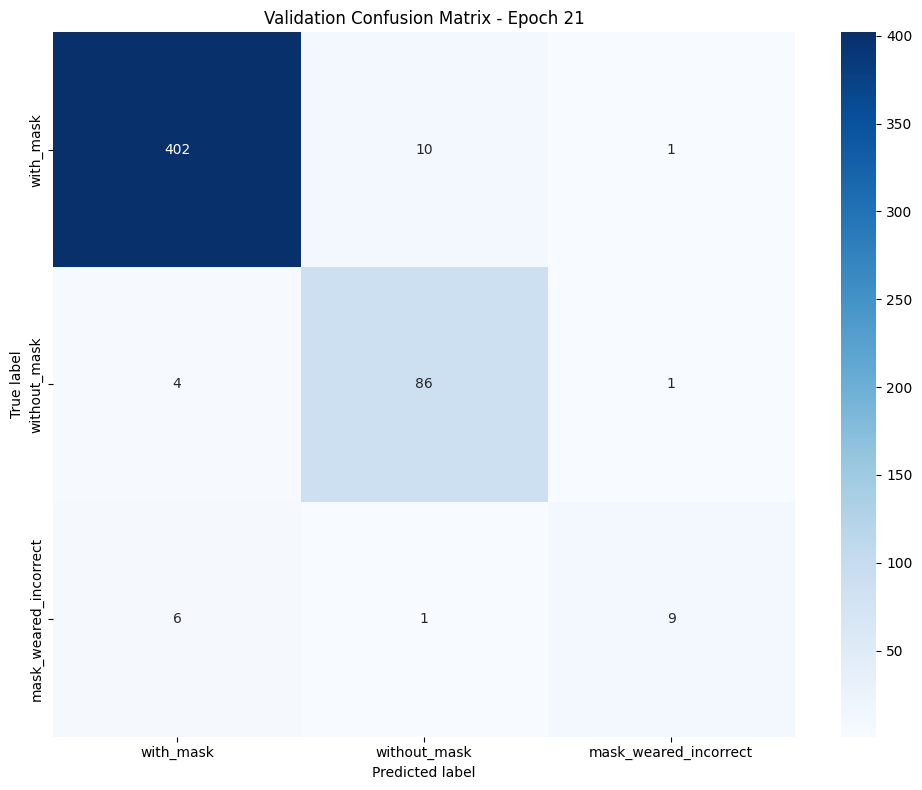

× No improvement for 2 epochs.
Current learning rate: 0.0005120000000000001
----------------------------------------
Epoch 22/30
----------------------------------------
Trainable parameters: 23,245,827 / 24,690,755 (94.15%)


train:   0%|          | 0/92 [00:00<?, ?it/s]<ipython-input-13-3b48f1ece74f>:74: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast():
train: 100%|██████████| 92/92 [00:13<00:00,  7.04it/s, loss=0.00323] 


TRAIN Loss: 0.0176 Acc: 0.9823
Class Accuracies: with_mask: 0.9724 | without_mask: 0.9869 | mask_weared_incorrect: 0.9871


val: 100%|██████████| 17/17 [00:01<00:00, 11.25it/s, loss=0.0457] 


VAL Loss: 0.0533 Acc: 0.9500
Class Accuracies: with_mask: 0.9516 | without_mask: 0.9890 | mask_weared_incorrect: 0.6875
× No improvement for 3 epochs.
Current learning rate: 0.0005120000000000001
----------------------------------------
Epoch 23/30
----------------------------------------
Unfreezing layer2...
Trainable parameters: 24,465,411 / 24,690,755 (99.09%)
Optimizer updated with new learning rates
  Group 0: lr = 0.0004096000000000001
  Group 1: lr = 4.0960000000000014e-05
  Group 2: lr = 4.096000000000001e-06
  Group 3: lr = 4.096000000000001e-07


train: 100%|██████████| 92/92 [00:14<00:00,  6.22it/s, loss=0.00389]


TRAIN Loss: 0.0158 Acc: 0.9820
Class Accuracies: with_mask: 0.9732 | without_mask: 0.9879 | mask_weared_incorrect: 0.9851


val: 100%|██████████| 17/17 [00:01<00:00, 11.44it/s, loss=0.0617] 


VAL Loss: 0.0566 Acc: 0.9615
Class Accuracies: with_mask: 0.9734 | without_mask: 0.9780 | mask_weared_incorrect: 0.5625
× No improvement for 4 epochs.
Current learning rate: 0.0004096000000000001
----------------------------------------
Epoch 24/30
----------------------------------------
Trainable parameters: 24,465,411 / 24,690,755 (99.09%)


train: 100%|██████████| 92/92 [00:14<00:00,  6.14it/s, loss=0.00239] 


TRAIN Loss: 0.0125 Acc: 0.9874
Class Accuracies: with_mask: 0.9822 | without_mask: 0.9873 | mask_weared_incorrect: 0.9928


val: 100%|██████████| 17/17 [00:01<00:00, 11.34it/s, loss=0.0851] 


VAL Loss: 0.0592 Acc: 0.9538
Class Accuracies: with_mask: 0.9685 | without_mask: 0.9451 | mask_weared_incorrect: 0.6250
× No improvement for 5 epochs.
Current learning rate: 0.0004096000000000001
----------------------------------------
Epoch 25/30
----------------------------------------
Trainable parameters: 24,465,411 / 24,690,755 (99.09%)


train: 100%|██████████| 92/92 [00:14<00:00,  6.25it/s, loss=0.0294]  


TRAIN Loss: 0.0197 Acc: 0.9813
Class Accuracies: with_mask: 0.9691 | without_mask: 0.9886 | mask_weared_incorrect: 0.9861


val: 100%|██████████| 17/17 [00:01<00:00, 11.41it/s, loss=0.14]  


VAL Loss: 0.0462 Acc: 0.9615
Class Accuracies: with_mask: 0.9709 | without_mask: 0.9780 | mask_weared_incorrect: 0.6250
× No improvement for 6 epochs.
Current learning rate: 0.0004096000000000001
----------------------------------------
Epoch 26/30
----------------------------------------
Trainable parameters: 24,465,411 / 24,690,755 (99.09%)


train: 100%|██████████| 92/92 [00:14<00:00,  6.16it/s, loss=0.00153] 


TRAIN Loss: 0.0162 Acc: 0.9837
Class Accuracies: with_mask: 0.9777 | without_mask: 0.9842 | mask_weared_incorrect: 0.9891


val: 100%|██████████| 17/17 [00:01<00:00, 11.46it/s, loss=0.121]  


VAL Loss: 0.0471 Acc: 0.9615
Class Accuracies: with_mask: 0.9734 | without_mask: 0.9560 | mask_weared_incorrect: 0.6875
× No improvement for 7 epochs.
Early stopping triggered after 7 epochs without improvement
----------------------------------------
Training complete in 6m 3s
Best validation Accuracy: 0.9615


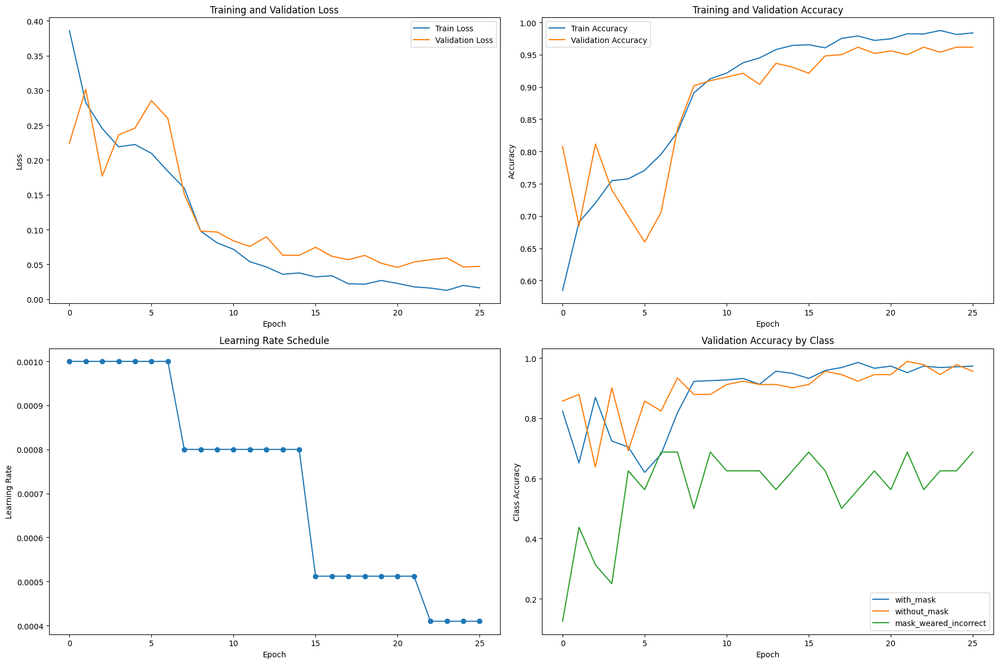

In [16]:
# Train the model with all improvements
model_resnet50, history_resnet50 = train_model_improved(
    model=model_resnet50,
    dataloaders=dataloaders,
    criterion=criterion,
    optimizer=optimizer,
    scheduler=scheduler,
    model_name='resnet50',
    num_epochs=30,
    device=device,
    early_stopping_patience=7
)

Evaluating ResNet50 Model on Test Dataset
Test Accuracy: 95.74%

Confusion Matrix:
[[475   7   3]
 [  6 102   0]
 [  6   4   8]]

Classification Report:
                       precision    recall  f1-score   support

            with_mask       0.98      0.98      0.98       485
         without_mask       0.90      0.94      0.92       108
mask_weared_incorrect       0.73      0.44      0.55        18

             accuracy                           0.96       611
            macro avg       0.87      0.79      0.82       611
         weighted avg       0.96      0.96      0.96       611



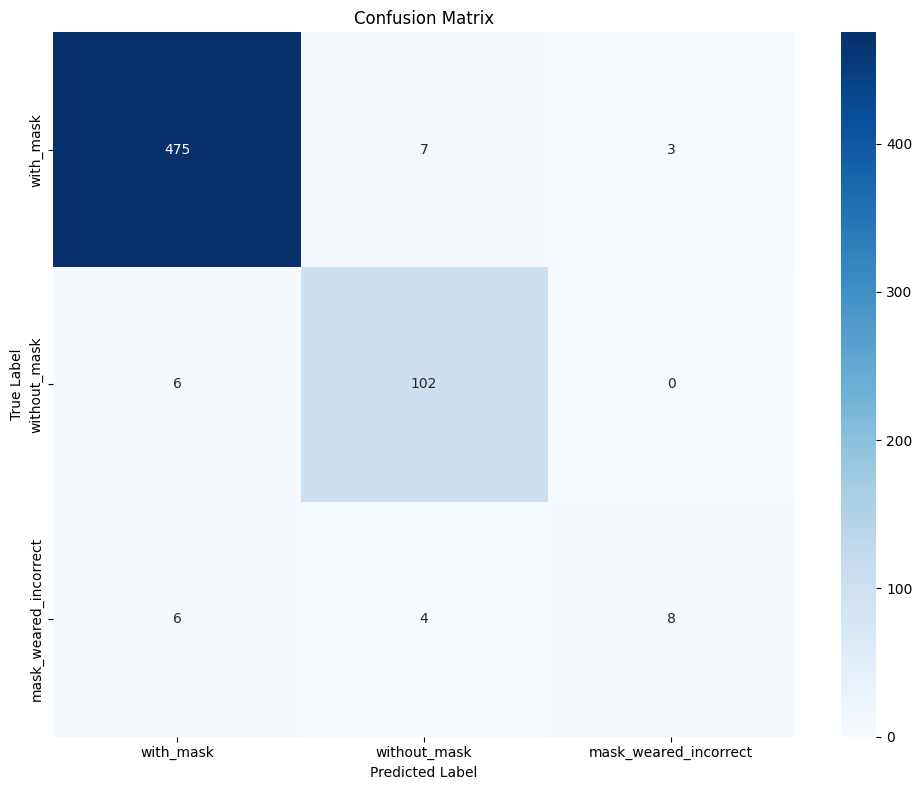


ResNet50 Predictions on Test Images:


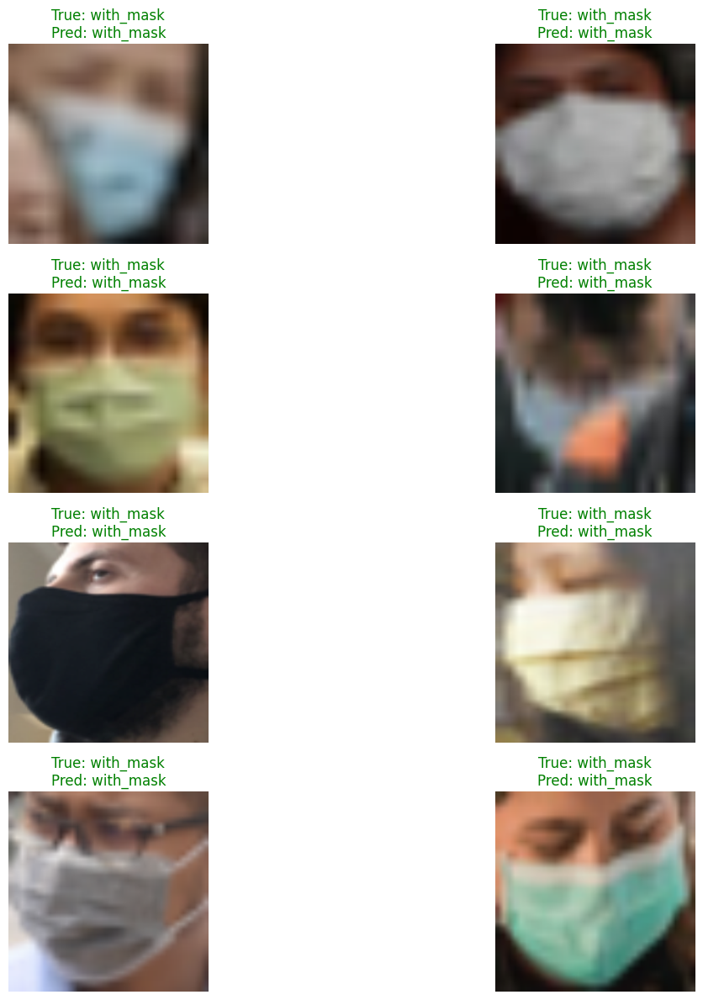

In [17]:
print("Evaluating ResNet50 Model on Test Dataset")
print("=" * 50)

# Evaluate ResNet50 model
model_resnet50.to(device)
resnet50_accuracy, resnet50_cm, resnet50_cr = evaluate_model_on_test(model_resnet50, dataloaders['test'], device)

# Visualize predictions on test images
print("\nResNet50 Predictions on Test Images:")
visualize_test_predictions(model_resnet50, dataloaders['test'], num_images=8, device=device)

## ResNet18 Training

In [19]:
# Initialize ResNet18 model
model_resnet18 = create_improved_model(model_name='resnet18', num_classes=3)
model_resnet18 = model_resnet18.to(device)

# Define loss function (Focal Loss)
criterion = FocalLoss(gamma=2)

# Define optimizer
optimizer = create_optimizer_with_layer_groups(model_resnet18, model_name='resnet18', base_lr=0.001)

# Define scheduler
scheduler = torch.optim.lr_scheduler.CosineAnnealingWarmRestarts(
    optimizer, 
    T_0=5,
    T_mult=2,
    eta_min=1e-6
)


Downloading: "https://download.pytorch.org/models/resnet18-f37072fd.pth" to /root/.cache/torch/hub/checkpoints/resnet18-f37072fd.pth
100%|██████████| 44.7M/44.7M [00:00<00:00, 208MB/s]


<ipython-input-13-3b48f1ece74f>:11: FutureWarning: `torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.
  scaler = torch.cuda.amp.GradScaler() if torch.cuda.is_available() else None


Epoch 1/30
----------------------------------------
Trainable parameters: 396,291 / 11,572,803 (3.42%)
Optimizer updated with new learning rates
  Group 0: lr = 0.001


train:   0%|          | 0/92 [00:00<?, ?it/s]<ipython-input-13-3b48f1ece74f>:74: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast():
train: 100%|██████████| 92/92 [00:09<00:00,  9.21it/s, loss=0.0877]


TRAIN Loss: 0.3334 Acc: 0.6362
Class Accuracies: with_mask: 0.6250 | without_mask: 0.6992 | mask_weared_incorrect: 0.5875


val: 100%|██████████| 17/17 [00:01<00:00, 14.18it/s, loss=0.183]


VAL Loss: 0.3168 Acc: 0.6365
Class Accuracies: with_mask: 0.6368 | without_mask: 0.6154 | mask_weared_incorrect: 0.7500


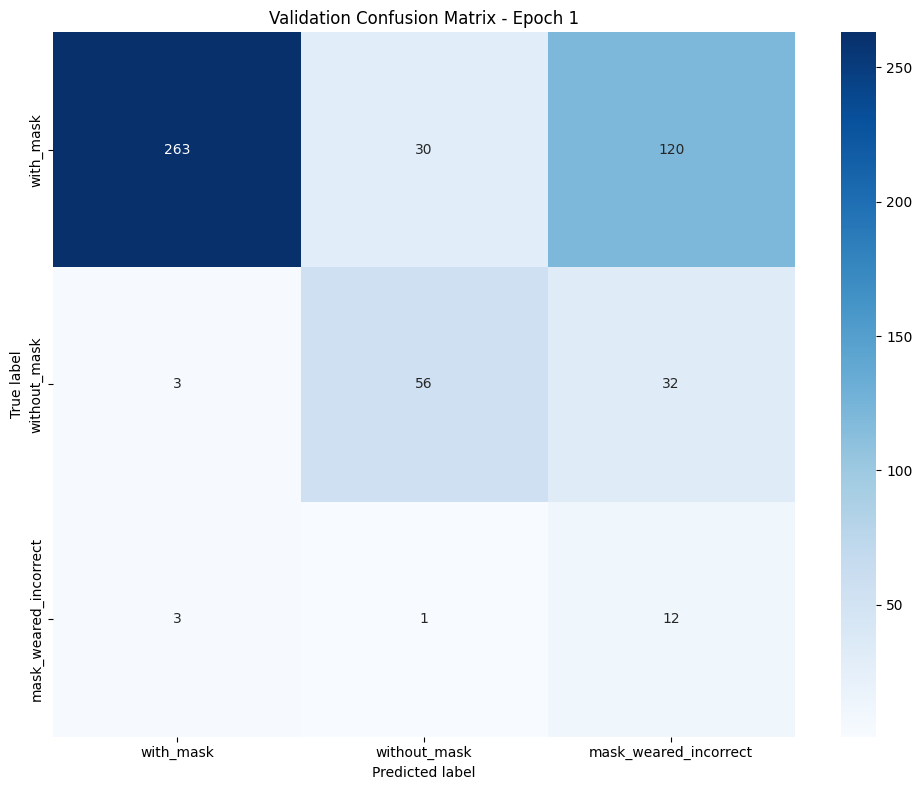

✓ New best model saved! Validation Accuracy: 0.6365
Current learning rate: 0.001
----------------------------------------
Epoch 2/30
----------------------------------------
Trainable parameters: 396,291 / 11,572,803 (3.42%)


train:   0%|          | 0/92 [00:00<?, ?it/s]<ipython-input-13-3b48f1ece74f>:74: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast():
train: 100%|██████████| 92/92 [00:10<00:00,  9.06it/s, loss=0.229]


TRAIN Loss: 0.2635 Acc: 0.7229
Class Accuracies: with_mask: 0.7331 | without_mask: 0.7649 | mask_weared_incorrect: 0.6711


val: 100%|██████████| 17/17 [00:00<00:00, 17.29it/s, loss=0.14]  


VAL Loss: 0.1447 Acc: 0.8577
Class Accuracies: with_mask: 0.9201 | without_mask: 0.6374 | mask_weared_incorrect: 0.5000
✓ New best model saved! Validation Accuracy: 0.8577
Current learning rate: 0.001
----------------------------------------
Epoch 3/30
----------------------------------------
Trainable parameters: 396,291 / 11,572,803 (3.42%)


train: 100%|██████████| 92/92 [00:10<00:00,  9.05it/s, loss=0.234]


TRAIN Loss: 0.2343 Acc: 0.7392
Class Accuracies: with_mask: 0.7487 | without_mask: 0.7784 | mask_weared_incorrect: 0.6935


val: 100%|██████████| 17/17 [00:00<00:00, 17.40it/s, loss=0.0996]


VAL Loss: 0.1586 Acc: 0.8288
Class Accuracies: with_mask: 0.8814 | without_mask: 0.6374 | mask_weared_incorrect: 0.5625
× No improvement for 1 epochs.
Current learning rate: 0.001
----------------------------------------
Epoch 4/30
----------------------------------------
Trainable parameters: 396,291 / 11,572,803 (3.42%)


train: 100%|██████████| 92/92 [00:10<00:00,  8.66it/s, loss=0.227] 


TRAIN Loss: 0.2126 Acc: 0.7633
Class Accuracies: with_mask: 0.7566 | without_mask: 0.8384 | mask_weared_incorrect: 0.6933


val: 100%|██████████| 17/17 [00:00<00:00, 17.59it/s, loss=0.135] 


VAL Loss: 0.1318 Acc: 0.8635
Class Accuracies: with_mask: 0.9419 | without_mask: 0.6044 | mask_weared_incorrect: 0.3125
✓ New best model saved! Validation Accuracy: 0.8635
Current learning rate: 0.001
----------------------------------------
Epoch 5/30
----------------------------------------
Trainable parameters: 396,291 / 11,572,803 (3.42%)


train: 100%|██████████| 92/92 [00:10<00:00,  9.12it/s, loss=0.231] 


TRAIN Loss: 0.2111 Acc: 0.7637
Class Accuracies: with_mask: 0.7642 | without_mask: 0.8181 | mask_weared_incorrect: 0.7074


val: 100%|██████████| 17/17 [00:00<00:00, 18.12it/s, loss=0.0445]


VAL Loss: 0.1333 Acc: 0.8750
Class Accuracies: with_mask: 0.8910 | without_mask: 0.8462 | mask_weared_incorrect: 0.6250
✓ New best model saved! Validation Accuracy: 0.8750
Current learning rate: 0.001
----------------------------------------
Epoch 6/30
----------------------------------------
Trainable parameters: 396,291 / 11,572,803 (3.42%)


train: 100%|██████████| 92/92 [00:10<00:00,  9.10it/s, loss=0.216] 


TRAIN Loss: 0.1938 Acc: 0.7844
Class Accuracies: with_mask: 0.7812 | without_mask: 0.8388 | mask_weared_incorrect: 0.7311


val: 100%|██████████| 17/17 [00:01<00:00, 16.92it/s, loss=0.0597]


VAL Loss: 0.1502 Acc: 0.8404
Class Accuracies: with_mask: 0.8257 | without_mask: 0.9451 | mask_weared_incorrect: 0.6250
× No improvement for 1 epochs.
Current learning rate: 0.001
----------------------------------------
Epoch 7/30
----------------------------------------
Trainable parameters: 396,291 / 11,572,803 (3.42%)


train: 100%|██████████| 92/92 [00:10<00:00,  8.60it/s, loss=0.181] 


TRAIN Loss: 0.1872 Acc: 0.7922
Class Accuracies: with_mask: 0.7911 | without_mask: 0.8485 | mask_weared_incorrect: 0.7369


val: 100%|██████████| 17/17 [00:00<00:00, 17.21it/s, loss=0.0875]


VAL Loss: 0.1372 Acc: 0.8615
Class Accuracies: with_mask: 0.9031 | without_mask: 0.7143 | mask_weared_incorrect: 0.6250
× No improvement for 2 epochs.
Current learning rate: 0.001
----------------------------------------
Epoch 8/30
----------------------------------------
Unfreezing layer4...
Trainable parameters: 8,790,019 / 11,572,803 (75.95%)
Optimizer updated with new learning rates
  Group 0: lr = 0.0008
  Group 1: lr = 8e-05


train: 100%|██████████| 92/92 [00:10<00:00,  8.93it/s, loss=0.0885]


TRAIN Loss: 0.1436 Acc: 0.8422
Class Accuracies: with_mask: 0.8586 | without_mask: 0.8690 | mask_weared_incorrect: 0.7981


val: 100%|██████████| 17/17 [00:00<00:00, 17.50it/s, loss=0.0385]


VAL Loss: 0.0574 Acc: 0.9538
Class Accuracies: with_mask: 0.9637 | without_mask: 0.9341 | mask_weared_incorrect: 0.8125
✓ New best model saved! Validation Accuracy: 0.9538
Current learning rate: 0.0008
----------------------------------------
Epoch 9/30
----------------------------------------
Trainable parameters: 8,790,019 / 11,572,803 (75.95%)


train: 100%|██████████| 92/92 [00:10<00:00,  8.95it/s, loss=0.0239]


TRAIN Loss: 0.0728 Acc: 0.9157
Class Accuracies: with_mask: 0.9160 | without_mask: 0.9281 | mask_weared_incorrect: 0.9028


val: 100%|██████████| 17/17 [00:00<00:00, 17.64it/s, loss=0.0489]


VAL Loss: 0.0816 Acc: 0.9019
Class Accuracies: with_mask: 0.9128 | without_mask: 0.8791 | mask_weared_incorrect: 0.7500
× No improvement for 1 epochs.
Current learning rate: 0.0008
----------------------------------------
Epoch 10/30
----------------------------------------
Trainable parameters: 8,790,019 / 11,572,803 (75.95%)


train: 100%|██████████| 92/92 [00:10<00:00,  8.55it/s, loss=0.0645]


TRAIN Loss: 0.0632 Acc: 0.9327
Class Accuracies: with_mask: 0.9270 | without_mask: 0.9362 | mask_weared_incorrect: 0.9345


val: 100%|██████████| 17/17 [00:00<00:00, 17.21it/s, loss=0.052] 


VAL Loss: 0.1134 Acc: 0.8904
Class Accuracies: with_mask: 0.9467 | without_mask: 0.6593 | mask_weared_incorrect: 0.7500
× No improvement for 2 epochs.
Current learning rate: 0.0008
----------------------------------------
Epoch 11/30
----------------------------------------
Trainable parameters: 8,790,019 / 11,572,803 (75.95%)


train: 100%|██████████| 92/92 [00:10<00:00,  8.92it/s, loss=0.0161] 


TRAIN Loss: 0.0504 Acc: 0.9473
Class Accuracies: with_mask: 0.9327 | without_mask: 0.9653 | mask_weared_incorrect: 0.9439


val: 100%|██████████| 17/17 [00:00<00:00, 17.41it/s, loss=0.0277]


VAL Loss: 0.0617 Acc: 0.9308
Class Accuracies: with_mask: 0.9298 | without_mask: 0.9670 | mask_weared_incorrect: 0.7500


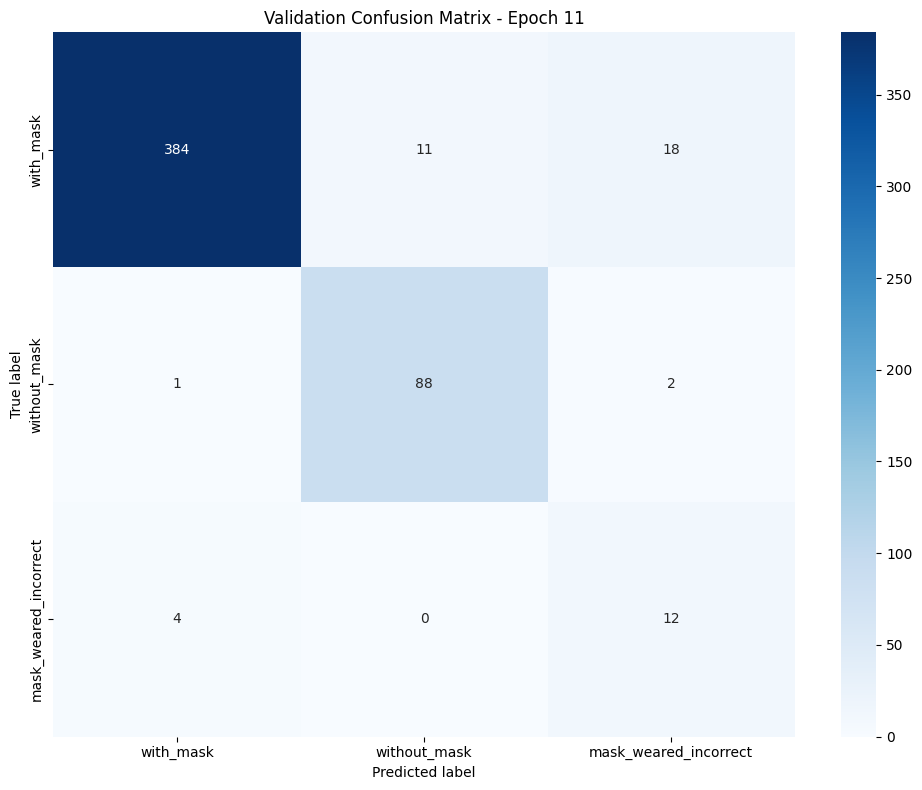

× No improvement for 3 epochs.
Current learning rate: 0.0008
----------------------------------------
Epoch 12/30
----------------------------------------
Trainable parameters: 8,790,019 / 11,572,803 (75.95%)


train:   0%|          | 0/92 [00:00<?, ?it/s]<ipython-input-13-3b48f1ece74f>:74: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast():
train: 100%|██████████| 92/92 [00:10<00:00,  8.99it/s, loss=0.0212] 


TRAIN Loss: 0.0391 Acc: 0.9575
Class Accuracies: with_mask: 0.9567 | without_mask: 0.9613 | mask_weared_incorrect: 0.9544


val: 100%|██████████| 17/17 [00:00<00:00, 17.22it/s, loss=0.0106] 


VAL Loss: 0.0532 Acc: 0.9577
Class Accuracies: with_mask: 0.9661 | without_mask: 0.9670 | mask_weared_incorrect: 0.6875
✓ New best model saved! Validation Accuracy: 0.9577
Current learning rate: 0.0008
----------------------------------------
Epoch 13/30
----------------------------------------
Trainable parameters: 8,790,019 / 11,572,803 (75.95%)


train: 100%|██████████| 92/92 [00:10<00:00,  8.58it/s, loss=0.00769]


TRAIN Loss: 0.0388 Acc: 0.9544
Class Accuracies: with_mask: 0.9489 | without_mask: 0.9591 | mask_weared_incorrect: 0.9556


val: 100%|██████████| 17/17 [00:00<00:00, 17.43it/s, loss=0.0246] 


VAL Loss: 0.0472 Acc: 0.9673
Class Accuracies: with_mask: 0.9758 | without_mask: 0.9670 | mask_weared_incorrect: 0.7500
✓ New best model saved! Validation Accuracy: 0.9673
Current learning rate: 0.0008
----------------------------------------
Epoch 14/30
----------------------------------------
Trainable parameters: 8,790,019 / 11,572,803 (75.95%)


train: 100%|██████████| 92/92 [00:10<00:00,  8.92it/s, loss=0.0206] 


TRAIN Loss: 0.0313 Acc: 0.9653
Class Accuracies: with_mask: 0.9647 | without_mask: 0.9697 | mask_weared_incorrect: 0.9616


val: 100%|██████████| 17/17 [00:00<00:00, 17.67it/s, loss=0.00297]


VAL Loss: 0.0403 Acc: 0.9635
Class Accuracies: with_mask: 0.9685 | without_mask: 0.9780 | mask_weared_incorrect: 0.7500
× No improvement for 1 epochs.
Current learning rate: 0.0008
----------------------------------------
Epoch 15/30
----------------------------------------
Trainable parameters: 8,790,019 / 11,572,803 (75.95%)


train: 100%|██████████| 92/92 [00:10<00:00,  8.96it/s, loss=0.026]  


TRAIN Loss: 0.0260 Acc: 0.9738
Class Accuracies: with_mask: 0.9690 | without_mask: 0.9715 | mask_weared_incorrect: 0.9808


val: 100%|██████████| 17/17 [00:00<00:00, 17.28it/s, loss=0.0017]


VAL Loss: 0.0857 Acc: 0.9269
Class Accuracies: with_mask: 0.9225 | without_mask: 0.9670 | mask_weared_incorrect: 0.8125
× No improvement for 2 epochs.
Current learning rate: 0.0008
----------------------------------------
Epoch 16/30
----------------------------------------
Unfreezing layer3...
Trainable parameters: 10,889,731 / 11,572,803 (94.10%)
Optimizer updated with new learning rates
  Group 0: lr = 0.0005120000000000001
  Group 1: lr = 5.120000000000001e-05
  Group 2: lr = 5.120000000000001e-06


train: 100%|██████████| 92/92 [00:10<00:00,  8.43it/s, loss=0.0136]  


TRAIN Loss: 0.0233 Acc: 0.9745
Class Accuracies: with_mask: 0.9644 | without_mask: 0.9778 | mask_weared_incorrect: 0.9814


val: 100%|██████████| 17/17 [00:00<00:00, 17.46it/s, loss=0.00468]


VAL Loss: 0.0364 Acc: 0.9750
Class Accuracies: with_mask: 0.9831 | without_mask: 0.9780 | mask_weared_incorrect: 0.7500
✓ New best model saved! Validation Accuracy: 0.9750
Current learning rate: 0.0005120000000000001
----------------------------------------
Epoch 17/30
----------------------------------------
Trainable parameters: 10,889,731 / 11,572,803 (94.10%)


train: 100%|██████████| 92/92 [00:10<00:00,  8.82it/s, loss=0.0226] 


TRAIN Loss: 0.0256 Acc: 0.9701
Class Accuracies: with_mask: 0.9629 | without_mask: 0.9720 | mask_weared_incorrect: 0.9749


val: 100%|██████████| 17/17 [00:00<00:00, 17.37it/s, loss=0.000696]


VAL Loss: 0.0403 Acc: 0.9692
Class Accuracies: with_mask: 0.9758 | without_mask: 0.9890 | mask_weared_incorrect: 0.6875
× No improvement for 1 epochs.
Current learning rate: 0.0005120000000000001
----------------------------------------
Epoch 18/30
----------------------------------------
Trainable parameters: 10,889,731 / 11,572,803 (94.10%)


train: 100%|██████████| 92/92 [00:10<00:00,  8.88it/s, loss=0.0227] 


TRAIN Loss: 0.0206 Acc: 0.9786
Class Accuracies: with_mask: 0.9694 | without_mask: 0.9816 | mask_weared_incorrect: 0.9847


val: 100%|██████████| 17/17 [00:01<00:00, 14.22it/s, loss=0.00523]


VAL Loss: 0.0431 Acc: 0.9673
Class Accuracies: with_mask: 0.9758 | without_mask: 0.9780 | mask_weared_incorrect: 0.6875
× No improvement for 2 epochs.
Current learning rate: 0.0005120000000000001
----------------------------------------
Epoch 19/30
----------------------------------------
Trainable parameters: 10,889,731 / 11,572,803 (94.10%)


train: 100%|██████████| 92/92 [00:10<00:00,  8.62it/s, loss=0.128]  


TRAIN Loss: 0.0230 Acc: 0.9796
Class Accuracies: with_mask: 0.9738 | without_mask: 0.9834 | mask_weared_incorrect: 0.9814


val: 100%|██████████| 17/17 [00:00<00:00, 17.45it/s, loss=0.00643]


VAL Loss: 0.0311 Acc: 0.9788
Class Accuracies: with_mask: 0.9855 | without_mask: 0.9890 | mask_weared_incorrect: 0.7500
✓ New best model saved! Validation Accuracy: 0.9788
Current learning rate: 0.0005120000000000001
----------------------------------------
Epoch 20/30
----------------------------------------
Trainable parameters: 10,889,731 / 11,572,803 (94.10%)


train: 100%|██████████| 92/92 [00:10<00:00,  8.87it/s, loss=0.0142]  


TRAIN Loss: 0.0230 Acc: 0.9759
Class Accuracies: with_mask: 0.9600 | without_mask: 0.9819 | mask_weared_incorrect: 0.9863


val: 100%|██████████| 17/17 [00:00<00:00, 17.72it/s, loss=0.00536]


VAL Loss: 0.0413 Acc: 0.9596
Class Accuracies: with_mask: 0.9637 | without_mask: 0.9780 | mask_weared_incorrect: 0.7500
× No improvement for 1 epochs.
Current learning rate: 0.0005120000000000001
----------------------------------------
Epoch 21/30
----------------------------------------
Trainable parameters: 10,889,731 / 11,572,803 (94.10%)


train: 100%|██████████| 92/92 [00:10<00:00,  8.45it/s, loss=0.0359] 


TRAIN Loss: 0.0158 Acc: 0.9820
Class Accuracies: with_mask: 0.9789 | without_mask: 0.9819 | mask_weared_incorrect: 0.9853


val: 100%|██████████| 17/17 [00:01<00:00, 16.93it/s, loss=0.00148] 


VAL Loss: 0.0273 Acc: 0.9808
Class Accuracies: with_mask: 0.9879 | without_mask: 0.9890 | mask_weared_incorrect: 0.7500


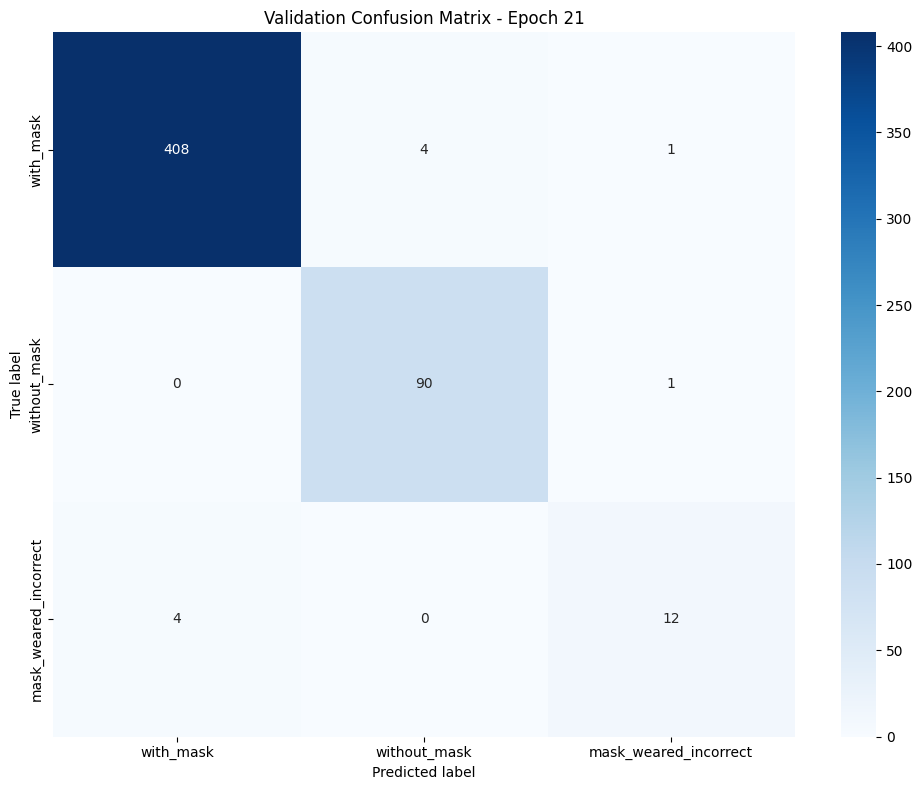

✓ New best model saved! Validation Accuracy: 0.9808
Current learning rate: 0.0005120000000000001
----------------------------------------
Epoch 22/30
----------------------------------------
Trainable parameters: 10,889,731 / 11,572,803 (94.10%)


train:   0%|          | 0/92 [00:00<?, ?it/s]<ipython-input-13-3b48f1ece74f>:74: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast():
train: 100%|██████████| 92/92 [00:10<00:00,  8.87it/s, loss=0.0109]  


TRAIN Loss: 0.0144 Acc: 0.9861
Class Accuracies: with_mask: 0.9826 | without_mask: 0.9909 | mask_weared_incorrect: 0.9846


val: 100%|██████████| 17/17 [00:00<00:00, 17.28it/s, loss=0.00139]


VAL Loss: 0.0303 Acc: 0.9692
Class Accuracies: with_mask: 0.9734 | without_mask: 0.9890 | mask_weared_incorrect: 0.7500
× No improvement for 1 epochs.
Current learning rate: 0.0005120000000000001
----------------------------------------
Epoch 23/30
----------------------------------------
Unfreezing layer2...
Trainable parameters: 11,415,299 / 11,572,803 (98.64%)
Optimizer updated with new learning rates
  Group 0: lr = 0.0004096000000000001
  Group 1: lr = 4.0960000000000014e-05
  Group 2: lr = 4.096000000000001e-06
  Group 3: lr = 4.096000000000001e-07


train: 100%|██████████| 92/92 [00:10<00:00,  8.63it/s, loss=0.00123] 


TRAIN Loss: 0.0128 Acc: 0.9840
Class Accuracies: with_mask: 0.9797 | without_mask: 0.9857 | mask_weared_incorrect: 0.9867


val: 100%|██████████| 17/17 [00:00<00:00, 17.04it/s, loss=0.0127] 


VAL Loss: 0.0331 Acc: 0.9654
Class Accuracies: with_mask: 0.9758 | without_mask: 0.9451 | mask_weared_incorrect: 0.8125
× No improvement for 2 epochs.
Current learning rate: 0.0004096000000000001
----------------------------------------
Epoch 24/30
----------------------------------------
Trainable parameters: 11,415,299 / 11,572,803 (98.64%)


train: 100%|██████████| 92/92 [00:11<00:00,  8.13it/s, loss=0.00479] 


TRAIN Loss: 0.0108 Acc: 0.9878
Class Accuracies: with_mask: 0.9817 | without_mask: 0.9882 | mask_weared_incorrect: 0.9930


val: 100%|██████████| 17/17 [00:01<00:00, 16.75it/s, loss=0.023]   


VAL Loss: 0.0361 Acc: 0.9808
Class Accuracies: with_mask: 0.9879 | without_mask: 0.9780 | mask_weared_incorrect: 0.8125
× No improvement for 3 epochs.
Current learning rate: 0.0004096000000000001
----------------------------------------
Epoch 25/30
----------------------------------------
Trainable parameters: 11,415,299 / 11,572,803 (98.64%)


train: 100%|██████████| 92/92 [00:10<00:00,  8.62it/s, loss=0.00184] 


TRAIN Loss: 0.0158 Acc: 0.9830
Class Accuracies: with_mask: 0.9741 | without_mask: 0.9859 | mask_weared_incorrect: 0.9888


val: 100%|██████████| 17/17 [00:01<00:00, 16.92it/s, loss=0.0247] 


VAL Loss: 0.0314 Acc: 0.9808
Class Accuracies: with_mask: 0.9903 | without_mask: 0.9670 | mask_weared_incorrect: 0.8125
× No improvement for 4 epochs.
Current learning rate: 0.0004096000000000001
----------------------------------------
Epoch 26/30
----------------------------------------
Trainable parameters: 11,415,299 / 11,572,803 (98.64%)


train: 100%|██████████| 92/92 [00:10<00:00,  8.68it/s, loss=0.00181] 


TRAIN Loss: 0.0138 Acc: 0.9833
Class Accuracies: with_mask: 0.9765 | without_mask: 0.9848 | mask_weared_incorrect: 0.9884


val: 100%|██████████| 17/17 [00:00<00:00, 17.20it/s, loss=0.0106]  


VAL Loss: 0.0423 Acc: 0.9750
Class Accuracies: with_mask: 0.9855 | without_mask: 0.9780 | mask_weared_incorrect: 0.6875
× No improvement for 5 epochs.
Current learning rate: 0.0004096000000000001
----------------------------------------
Epoch 27/30
----------------------------------------
Trainable parameters: 11,415,299 / 11,572,803 (98.64%)


train: 100%|██████████| 92/92 [00:11<00:00,  8.18it/s, loss=0.00933] 


TRAIN Loss: 0.0126 Acc: 0.9847
Class Accuracies: with_mask: 0.9784 | without_mask: 0.9853 | mask_weared_incorrect: 0.9902


val: 100%|██████████| 17/17 [00:01<00:00, 16.94it/s, loss=0.0197] 


VAL Loss: 0.0291 Acc: 0.9846
Class Accuracies: with_mask: 0.9952 | without_mask: 0.9780 | mask_weared_incorrect: 0.7500
✓ New best model saved! Validation Accuracy: 0.9846
Current learning rate: 0.0004096000000000001
----------------------------------------
Epoch 28/30
----------------------------------------
Trainable parameters: 11,415,299 / 11,572,803 (98.64%)


train: 100%|██████████| 92/92 [00:10<00:00,  8.67it/s, loss=0.00222] 


TRAIN Loss: 0.0104 Acc: 0.9854
Class Accuracies: with_mask: 0.9761 | without_mask: 0.9876 | mask_weared_incorrect: 0.9921


val: 100%|██████████| 17/17 [00:00<00:00, 17.25it/s, loss=0.0204]  


VAL Loss: 0.0331 Acc: 0.9808
Class Accuracies: with_mask: 0.9952 | without_mask: 0.9560 | mask_weared_incorrect: 0.7500
× No improvement for 1 epochs.
Current learning rate: 0.0004096000000000001
----------------------------------------
Epoch 29/30
----------------------------------------
Trainable parameters: 11,415,299 / 11,572,803 (98.64%)


train: 100%|██████████| 92/92 [00:10<00:00,  8.66it/s, loss=0.00294] 


TRAIN Loss: 0.0157 Acc: 0.9827
Class Accuracies: with_mask: 0.9770 | without_mask: 0.9845 | mask_weared_incorrect: 0.9866


val: 100%|██████████| 17/17 [00:01<00:00, 16.63it/s, loss=0.0118] 


VAL Loss: 0.0300 Acc: 0.9654
Class Accuracies: with_mask: 0.9734 | without_mask: 0.9560 | mask_weared_incorrect: 0.8125
× No improvement for 2 epochs.
Current learning rate: 0.0004096000000000001
----------------------------------------
Epoch 30/30
----------------------------------------
Trainable parameters: 11,415,299 / 11,572,803 (98.64%)


train: 100%|██████████| 92/92 [00:11<00:00,  8.25it/s, loss=0.002]   


TRAIN Loss: 0.0095 Acc: 0.9908
Class Accuracies: with_mask: 0.9853 | without_mask: 0.9931 | mask_weared_incorrect: 0.9938


val: 100%|██████████| 17/17 [00:00<00:00, 17.36it/s, loss=0.00851]


VAL Loss: 0.0290 Acc: 0.9731
Class Accuracies: with_mask: 0.9855 | without_mask: 0.9560 | mask_weared_incorrect: 0.7500
× No improvement for 3 epochs.
Current learning rate: 0.0004096000000000001
----------------------------------------
Training complete in 5m 47s
Best validation Accuracy: 0.9846


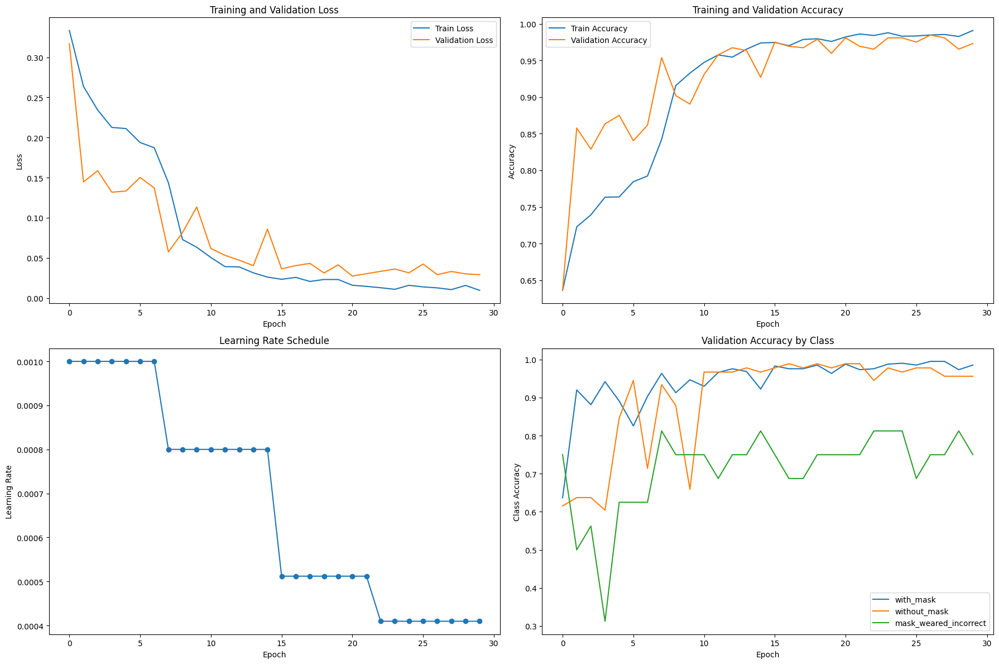

In [20]:
# Train ResNet18 model
model_resnet18, history_resnet18 = train_model_improved(
    model=model_resnet18,
    dataloaders=dataloaders,
    criterion=criterion,
    optimizer=optimizer,
    scheduler=scheduler,
    model_name='resnet18',
    num_epochs=30,
    device=device,
    early_stopping_patience=7
)

Evaluating ResNet18 Model on Test Dataset
Test Accuracy: 96.24%

Confusion Matrix:
[[479   3   3]
 [  6 101   1]
 [  6   4   8]]

Classification Report:
                       precision    recall  f1-score   support

            with_mask       0.98      0.99      0.98       485
         without_mask       0.94      0.94      0.94       108
mask_weared_incorrect       0.67      0.44      0.53        18

             accuracy                           0.96       611
            macro avg       0.86      0.79      0.82       611
         weighted avg       0.96      0.96      0.96       611



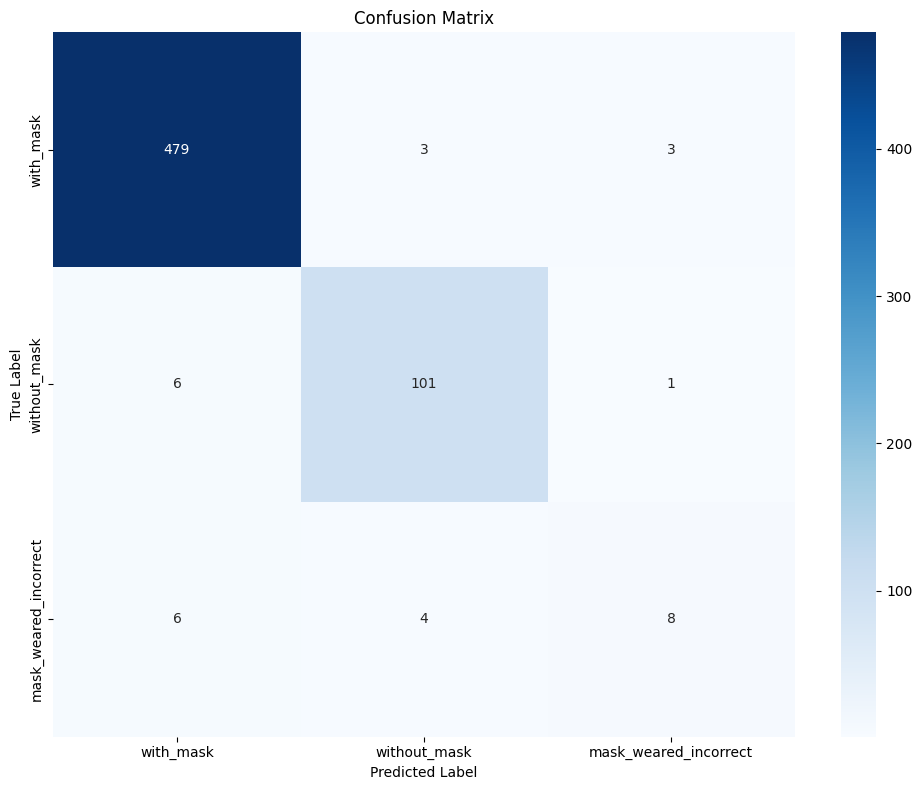


ResNet18 Predictions on Test Images:


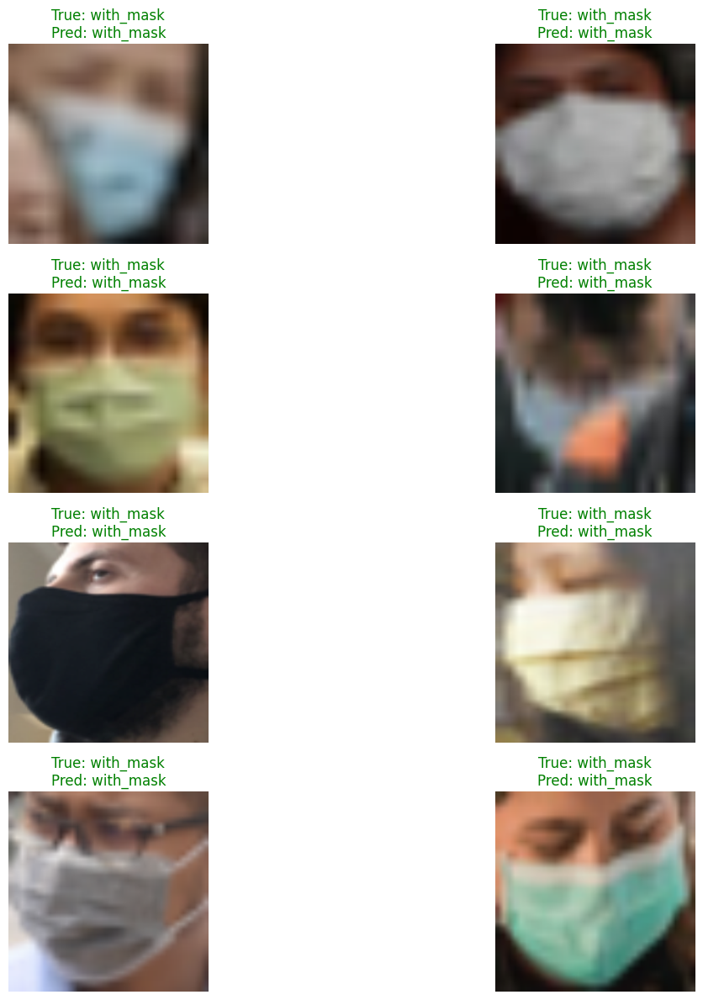

In [21]:
print("Evaluating ResNet18 Model on Test Dataset")
print("=" * 50)

# Evaluate ResNet18 model
model_resnet18.to(device)
resnet18_accuracy, resnet18_cm, resnet18_cr = evaluate_model_on_test(model_resnet18, dataloaders['test'], device)

# Visualize predictions on test images
print("\nResNet18 Predictions on Test Images:")
visualize_test_predictions(model_resnet18, dataloaders['test'], num_images=8, device=device)

In [22]:
import torch
import os

# Create a directory to save models if it doesn't exist
save_dir = 'saved_models'
os.makedirs(save_dir, exist_ok=True)

# Option 1: Save the entire models (architecture + weights)
torch.save(model_resnet50, os.path.join(save_dir, 'full_model_resnet50.pth'))
torch.save(model_resnet18, os.path.join(save_dir, 'full_model_resnet18.pth'))

# Option 2: Save just the state dictionaries (recommended)
torch.save(model_resnet50.state_dict(), os.path.join(save_dir, 'model_resnet50_state_dict.pth'))
torch.save(model_resnet18.state_dict(), os.path.join(save_dir, 'model_resnet18_state_dict.pth'))

print(f"Models saved successfully in '{save_dir}' directory")

Models saved successfully in 'saved_models' directory


### Testing input images for resnet50

<ipython-input-23-92daeb22ba0b>:74: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(model_path, map_location=device))


Models loaded successfully!
Processing image: /kaggle/input/bafmd-timepass/EateOBVUEAALop2.jpg
Image loaded successfully. Dimensions: (900, 1200, 3)
DNN model files are ready.
DNN face detector model loaded successfully.
Processing 200 potential detections
Face #1 detected with confidence 0.9978
Face #1 - Predicted 'with_mask' with probability 0.9804
Face #2 detected with confidence 0.8816
Face #2 - Predicted 'with_mask' with probability 0.9311


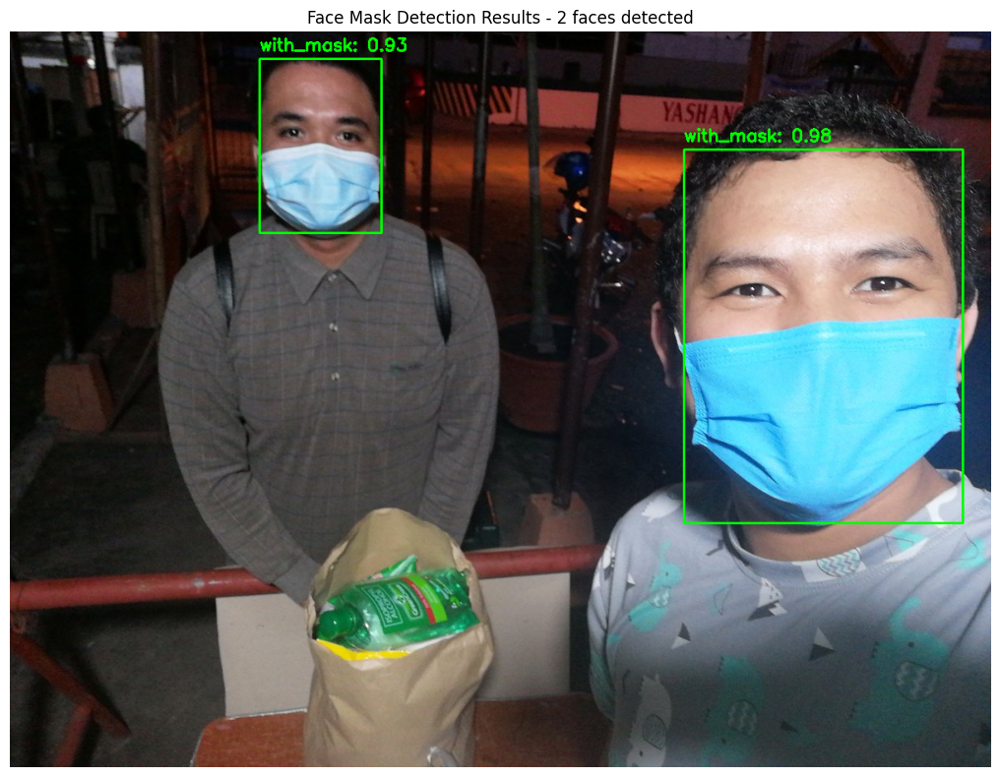


Processing completed. Check output.jpg for results.


In [23]:
import torch
import torch.nn as nn
from torchvision import models
import torch.nn.functional as F
from PIL import Image
import torchvision.transforms as transforms
import cv2  # Import OpenCV
import os
import numpy as np  # Required for DNN face detector
import matplotlib.pyplot as plt  


def create_improved_model(model_name='resnet50', num_classes=3, pretrained=True):
    """
    Create an improved model with a more sophisticated architecture
    """
    if model_name == 'resnet50':
        if pretrained:
            model = models.resnet50(weights=models.ResNet50_Weights.DEFAULT)
        else:
            model = models.resnet50(weights=None)
    elif model_name == 'resnet18':
        if pretrained:
            model = models.resnet18(weights=models.ResNet18_Weights.DEFAULT)
        else:
            model = models.resnet18(weights=None)
    else:
        raise ValueError(f"Unsupported model: {model_name}")
    
    # Freeze all layers initially
    for param in model.parameters():
        param.requires_grad = False
    
    # Replace the classifier head
    if model_name.startswith('resnet'):
        num_ftrs = model.fc.in_features
        model.fc = nn.Sequential(
            nn.Linear(num_ftrs, 512),
            nn.BatchNorm1d(512),
            nn.ReLU(inplace=True),
            nn.Dropout(0.5),
            nn.Linear(512, 256),
            nn.BatchNorm1d(256),
            nn.ReLU(inplace=True),
            nn.Dropout(0.4),
            nn.Linear(256, num_classes)
        )
    
    return model

def load_model(model_path, model_type='resnet18', load_type='state_dict'):
    """
    Load a trained face mask detection model
    
    Args:
        model_path: Path to the saved model file
        model_type: 'resnet18' or 'resnet50'
        load_type: 'state_dict' or 'full_model'
    
    Returns:
        The loaded model
    """
    # Set device
    device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
    
    if load_type == 'full_model':
        # Load entire model (architecture + weights)
        model = torch.load(model_path, map_location=device)
    else:
        # Create model architecture first
        model = create_improved_model(model_name=model_type, pretrained=False, num_classes=3)
        
        # Load state dictionary
        model.load_state_dict(torch.load(model_path, map_location=device))
    
    # Set model to evaluation mode
    model.eval()
    model.to(device)
    
    return model


# Define paths
save_dir = 'saved_models'

# Option 2: Load from state dictionaries (recommended)
resnet50_model_sd = load_model(
    model_path=f"{save_dir}/model_resnet50_state_dict.pth",
    model_type='resnet50',
    load_type='state_dict'
)

resnet18_model_sd = load_model(
    model_path=f"{save_dir}/model_resnet18_state_dict.pth",
    model_type='resnet18',
    load_type='state_dict'
)

print("Models loaded successfully!")


def predict_mask(face_image, model, device=None):
    """
    Predict mask status from an image of a single face
    
    Args:
        face_image: Image of a single face (PIL Image object)
        model: Loaded model
        device: Computation device
    
    Returns:
        Prediction class and probability
    """
    if device is None:
        device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
    
    # Define image transformation
    transform = transforms.Compose([
        transforms.Resize((226, 226)),
        transforms.ToTensor(),
        transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
    ])
    
    # Preprocess the face image
    image_tensor = transform(face_image).unsqueeze(0).to(device)
    
    # Make prediction
    with torch.no_grad():
        outputs = model(image_tensor)
        probabilities = F.softmax(outputs, dim=1)
        _, predicted = torch.max(outputs, 1)
    
    # Get prediction details
    prediction_idx = predicted.item()
    probability = probabilities[0][prediction_idx].item()
    
    class_names = ['with_mask', 'without_mask', 'mask_weared_incorrect']
    predicted_class = class_names[prediction_idx]
    
    return predicted_class, probability

def download_dnn_models():
    """
    Download DNN face detector model files if they don't exist
    """
    model_file = "res10_300x300_ssd_iter_140000.caffemodel"
    config_file = "deploy.prototxt"
    
    if not os.path.isfile(model_file):
        print(f"Downloading {model_file}...")
        os.system("wget https://raw.githubusercontent.com/opencv/opencv_3rdparty/dnn_samples_face_detector_20170830/res10_300x300_ssd_iter_140000.caffemodel")
    
    if not os.path.isfile(config_file):
        print(f"Downloading {config_file}...")
        os.system("wget https://raw.githubusercontent.com/opencv/opencv/master/samples/dnn/face_detector/deploy.prototxt")
    
    if os.path.isfile(model_file) and os.path.isfile(config_file):
        print("DNN model files are ready.")
        return True
    else:
        print("Failed to download DNN model files. Please download them manually:")
        print("wget https://raw.githubusercontent.com/opencv/opencv/master/samples/dnn/face_detector/deploy.prototxt")
        print("wget https://raw.githubusercontent.com/opencv/opencv_3rdparty/dnn_samples_face_detector_20170830/res10_300x300_ssd_iter_140000.caffemodel")
        return False

def detect_and_predict_mask(image_path, model, show_image=True):
    """
    Detect faces in an image using DNN-based detector, predict mask status for each face,
    and draw bounding boxes. This method is more robust than Haar Cascade.
    
    Args:
        image_path: Path to the image
        model: Loaded model for mask prediction
    """
    # Check if the image file exists
    if not os.path.isfile(image_path):
        print(f"Error: Image file '{image_path}' not found.")
        return
    
    # Load the image with OpenCV
    img = cv2.imread(image_path)
    if img is None:
        print(f"Error: Could not load image at path: {image_path}")
        return
    
    print(f"Image loaded successfully. Dimensions: {img.shape}")
    
    # Download and check DNN model files
    model_file = "res10_300x300_ssd_iter_140000.caffemodel"
    config_file = "deploy.prototxt"
    
    if not (os.path.isfile(model_file) and os.path.isfile(config_file)):
        if not download_dnn_models():
            print("Cannot continue without DNN model files.")
            return
    
    # Load the DNN face detector model
    try:
        net = cv2.dnn.readNetFromCaffe(config_file, model_file)
        print("DNN face detector model loaded successfully.")
    except Exception as e:
        print(f"Error loading DNN model: {str(e)}")
        return
    
    # Get image dimensions
    (h, w) = img.shape[:2]
    
    # Preprocess the image for the DNN
    blob = cv2.dnn.blobFromImage(
        cv2.resize(img, (300, 300)), 1.0,
        (300, 300), (104.0, 177.0, 123.0)
    )
    
    # Pass the blob through the network and get detections
    net.setInput(blob)
    detections = net.forward()
    print(f"Processing {detections.shape[2]} potential detections")
    
    # Counter for detected faces
    face_count = 0
    
    # Loop over the detections
    for i in range(0, detections.shape[2]):
        # Extract the confidence associated with the prediction
        confidence = detections[0, 0, i, 2]
        
        # Filter out weak detections
        if confidence > 0.5:
            face_count += 1
            print(f"Face #{face_count} detected with confidence {confidence:.4f}")
            
            # Compute the (x, y)-coordinates of the bounding box
            box = detections[0, 0, i, 3:7] * np.array([w, h, w, h])
            (startX, startY, endX, endY) = box.astype("int")
            
            # Ensure the bounding boxes are within the dimensions of the frame
            startX = max(0, startX)
            startY = max(0, startY)
            endX = min(w - 1, endX)
            endY = min(h - 1, endY)
            
            # Extract the face ROI
            face_roi = img[startY:endY, startX:endX]
            
            # Check if the ROI is valid
            if face_roi.size == 0:
                print(f"Face #{face_count} - Invalid ROI. Skipping...")
                continue
            
            # Convert to PIL Image for classification
            try:
                face_image = Image.fromarray(cv2.cvtColor(face_roi, cv2.COLOR_BGR2RGB))
            except Exception as e:
                print(f"Face #{face_count} - Error converting to PIL Image: {str(e)}")
                continue
                
            # Predict mask status
            predicted_class, probability = predict_mask(face_image, model)
            print(f"Face #{face_count} - Predicted '{predicted_class}' with probability {probability:.4f}")
            
            # Color based on prediction
            if predicted_class == 'with_mask':
                color = (0, 255, 0)  # Green for with_mask
            elif predicted_class == 'without_mask':
                color = (0, 0, 255)  # Red for without_mask
            else:
                color = (255, 0, 0)  # Blue for mask_weared_incorrect
            
            # Draw the bounding box and label
            cv2.rectangle(img, (startX, startY), (endX, endY), color, 2)
            
            # Add label above the bounding box
            label = f"{predicted_class}: {probability:.2f}"
            y = startY - 10 if startY - 10 > 10 else startY + 10
            cv2.putText(img, label, (startX, y),
                        cv2.FONT_HERSHEY_SIMPLEX, 0.7, color, 2)
    
    # If no faces detected
    if face_count == 0:
        print("No faces detected in the image.")
        cv2.putText(img, "No faces detected", (50, 50),
                    cv2.FONT_HERSHEY_SIMPLEX, 1, (0, 0, 255), 2)
    
    if show_image:
        # Convert BGR to RGB for matplotlib
        img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        plt.figure(figsize=(12, 8))
        plt.imshow(img_rgb)
        plt.title(f"Face Mask Detection Results - {face_count} faces detected")
        plt.axis('off')  # Hide the axes
        plt.tight_layout()
        plt.show()
    
    # Save the output image
    # output_path = 'output.jpg'
    # cv2.imwrite(output_path, img)
    # print(f"Output image with {face_count} bounding boxes saved as '{output_path}'.")

if __name__ == "__main__":
    # Example usage:
    image_path = '/kaggle/input/bafmd-timepass/EateOBVUEAALop2.jpg'  # Replace with the actual path to your image
    
    print(f"Processing image: {image_path}")
    
    # Use the DNN face detector for mask detection
    detect_and_predict_mask(image_path, resnet50_model_sd, show_image=True)
    
    print(f"\nProcessing completed. Check output.jpg for results.")

Processing image: /kaggle/input/biswas-testing/Eapj9pkU0AA4MfU.jpg
Image loaded successfully. Dimensions: (711, 1200, 3)
DNN face detector model loaded successfully.
Processing 200 potential detections
Face #1 detected with confidence 0.9994
Face #1 - Predicted 'without_mask' with probability 0.8961
Face #2 detected with confidence 0.8624
Face #2 - Predicted 'mask_weared_incorrect' with probability 0.8821
Face #3 detected with confidence 0.6951
Face #3 - Predicted 'mask_weared_incorrect' with probability 0.9906
Face #4 detected with confidence 0.6445
Face #4 - Predicted 'mask_weared_incorrect' with probability 0.5923


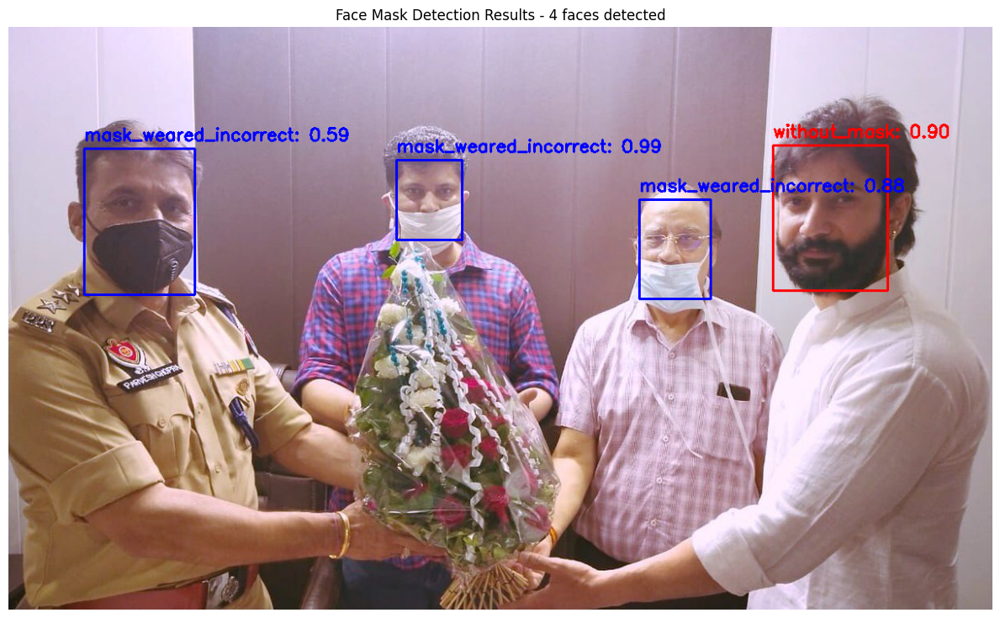


Processing completed. Check output.jpg for results.


In [24]:
if __name__ == "__main__":
    # Example usage:
    image_path = '/kaggle/input/biswas-testing/Eapj9pkU0AA4MfU.jpg'  # Replace with the actual path to your image
    
    print(f"Processing image: {image_path}")
    
    # Use the DNN face detector for mask detection
    detect_and_predict_mask(image_path, resnet50_model_sd, show_image=True)
    
    print(f"\nProcessing completed. Check output.jpg for results.")

### Testing input images for resnet18

Processing image: /kaggle/input/biswas-testing/Eapj9pkU0AA4MfU.jpg
Image loaded successfully. Dimensions: (711, 1200, 3)
DNN face detector model loaded successfully.
Processing 200 potential detections
Face #1 detected with confidence 0.9994
Face #1 - Predicted 'without_mask' with probability 0.7533
Face #2 detected with confidence 0.8624
Face #2 - Predicted 'mask_weared_incorrect' with probability 0.9469
Face #3 detected with confidence 0.6951
Face #3 - Predicted 'mask_weared_incorrect' with probability 0.9008
Face #4 detected with confidence 0.6445
Face #4 - Predicted 'with_mask' with probability 0.9198


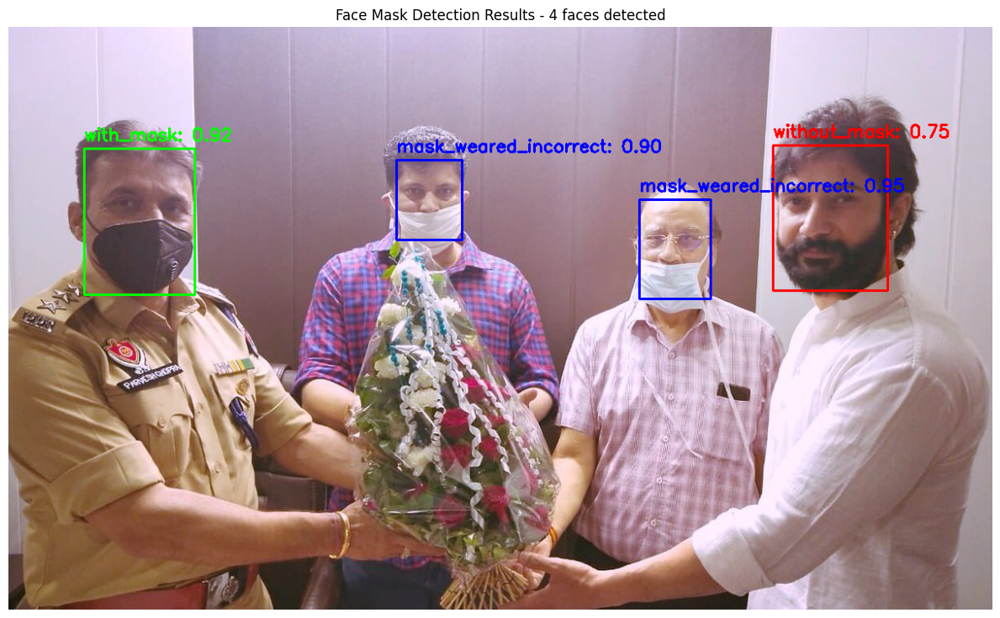


Processing completed. Check output.jpg for results.


In [26]:
if __name__ == "__main__":
    # Example usage:
    image_path = '/kaggle/input/biswas-testing/Eapj9pkU0AA4MfU.jpg'  # Replace with the actual path to your image
    
    print(f"Processing image: {image_path}")
    
    # Use the DNN face detector for mask detection
    detect_and_predict_mask(image_path, resnet18_model_sd, show_image=True)
    
    print(f"\nProcessing completed. Check output.jpg for results.")

# Face Mask Detection using FasterRCNN

In [27]:
import torch
import os
import xml.etree.ElementTree as ET
import cv2
from torch.utils.data import Dataset

class MaskDataset(Dataset):
    def __init__(self, img_dir, ann_dir, transforms=None):
        self.img_dir = img_dir
        self.ann_dir = ann_dir
        self.transforms = transforms
        self.classes = {'with_mask':1, 'without_mask':2, 'mask_weared_incorrect':3}
        self.images = sorted(os.listdir(img_dir))

    def __len__(self):
        return len(self.images)

    def __getitem__(self, idx):
        img_path = os.path.join(self.img_dir, self.images[idx])
        ann_path = os.path.join(self.ann_dir, os.path.splitext(self.images[idx])[0] + '.xml')

        img = cv2.imread(img_path)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

        tree = ET.parse(ann_path)
        root = tree.getroot()

        boxes = []
        labels = []

        for obj in root.findall('object'):
            label = obj.find('name').text
            labels.append(self.classes[label])

            bndbox = obj.find('bndbox')
            xmin = int(bndbox.find('xmin').text)
            ymin = int(bndbox.find('ymin').text)
            xmax = int(bndbox.find('xmax').text)
            ymax = int(bndbox.find('ymax').text)
            boxes.append([xmin, ymin, xmax, ymax])

        boxes = torch.as_tensor(boxes, dtype=torch.float32)
        labels = torch.as_tensor(labels, dtype=torch.int64)

        target = {
            'boxes': boxes,
            'labels': labels,
            'image_id': torch.tensor([idx]),
            'area': (boxes[:, 3] - boxes[:, 1]) * (boxes[:, 2] - boxes[:, 0]),
            'iscrowd': torch.zeros((len(labels),), dtype=torch.int64)
        }

        if self.transforms:
            img = self.transforms(img)

        img = torch.from_numpy(img / 255.).permute(2,0,1).float()

        return img, target


In [28]:
path_annotations = "/kaggle/input/face-mask-detection/annotations/" 
path_image = "/kaggle/input/face-mask-detection/images/"

In [29]:
import torch, torchvision
from torch.utils.data import DataLoader, random_split
from torchvision.models.detection.faster_rcnn import FastRCNNPredictor
import matplotlib.pyplot as plt
from tqdm import tqdm


# Custom collate function
def collate_fn(batch):
    return tuple(zip(*batch))

# Create dataset and split into train and validation
dataset = MaskDataset(path_image, path_annotations )
train_size = int(0.8 * len(dataset))
val_size = len(dataset) - train_size
train_ds, val_ds = random_split(dataset, [train_size, val_size])

# Data Loaders
train_loader = DataLoader(train_ds, batch_size=4, shuffle=True, collate_fn=collate_fn)
val_loader = DataLoader(val_ds, batch_size=2, shuffle=False, collate_fn=collate_fn)


In [30]:
import torchvision.models as models

def get_model(output_shape):
    model = models.detection.fasterrcnn_resnet50_fpn(pretrained=True)
    in_features = model.roi_heads.box_predictor.cls_score.in_features
    model.roi_heads.box_predictor = models.detection.faster_rcnn.FastRCNNPredictor(in_features, output_shape)
    
    return model

# Initialize model for 3 classes + background (total 4)
model = get_model(4)


/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=FasterRCNN_ResNet50_FPN_Weights.COCO_V1`. You can also use `weights=FasterRCNN_ResNet50_FPN_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/fasterrcnn_resnet50_fpn_coco-258fb6c6.pth" to /root/.cache/torch/hub/checkpoints/fasterrcnn_resnet50_fpn_coco-258fb6c6.pth
100%|██████████| 160M/160M [00:00<00:00, 236MB/s] 


In [31]:
# Device configuration
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model = get_model(4).to(device)  # 3 classes + background

optimizer = torch.optim.SGD(model.parameters(), lr=0.005, momentum=0.9, weight_decay=0.0005)

# Training and validation loop
num_epochs = 5
train_losses, val_losses = [], []
train_accs, val_accs = [], []

for epoch in range(num_epochs):
    model.train()
    train_loss, correct, total = 0, 0, 0

    for imgs, targets in tqdm(train_loader, desc=f"Training Epoch {epoch+1}/{num_epochs}"):
        imgs = [img.to(device) for img in imgs]
        targets = [{k: v.to(device) for k, v in t.items()} for t in targets]

        loss_dict = model(imgs, targets)
        losses = sum(loss for loss in loss_dict.values())

        optimizer.zero_grad()
        losses.backward()
        optimizer.step()

        train_loss += losses.item()
        correct += int(losses.item() < 1)
        total += len(imgs)

    train_losses.append(train_loss/len(train_loader))
    train_accs.append(correct/total)

    model.train()  # required to get losses for val
    val_loss, correct, total = 0, 0, 0

    with torch.no_grad():
        for imgs, targets in tqdm(val_loader, desc=f"Validation Epoch {epoch+1}/{num_epochs}"):
            imgs = [img.to(device) for img in imgs]
            targets = [{k: v.to(device) for k, v in t.items()} for t in targets]

            loss_dict = model(imgs, targets)
            losses = sum(loss for loss in loss_dict.values())

            val_loss += losses.item()
            correct += int(losses.item() < 1)
            total += len(imgs)

    val_losses.append(val_loss/len(val_loader))
    val_accs.append(correct/total)

    print(f"Epoch [{epoch+1}/{num_epochs}]")
    print(f"Train Loss: {train_losses[-1]:.4f}, Train Acc: {train_accs[-1]:.4f}")
    print(f"Val Loss: {val_losses[-1]:.4f}, Val Acc: {val_accs[-1]:.4f}")

# Save model
torch.save(model.state_dict(), "face_mask_detector.pth")


Validation Epoch 1/5: 100%|██████████| 86/86 [00:16<00:00,  5.37it/s]


Epoch [1/5]
Train Loss: 0.4481, Train Acc: 0.2419
Val Loss: 0.3294, Val Acc: 0.5029


Validation Epoch 2/5: 100%|██████████| 86/86 [00:15<00:00,  5.54it/s]


Epoch [2/5]
Train Loss: 0.2931, Train Acc: 0.2507
Val Loss: 0.2825, Val Acc: 0.5029


Validation Epoch 3/5: 100%|██████████| 86/86 [00:15<00:00,  5.55it/s]


Epoch [3/5]
Train Loss: 0.2417, Train Acc: 0.2507
Val Loss: 0.2846, Val Acc: 0.5029


Validation Epoch 4/5: 100%|██████████| 86/86 [00:15<00:00,  5.53it/s]


Epoch [4/5]
Train Loss: 0.2103, Train Acc: 0.2507
Val Loss: 0.2710, Val Acc: 0.5029


Validation Epoch 5/5: 100%|██████████| 86/86 [00:16<00:00,  5.29it/s]


Epoch [5/5]
Train Loss: 0.1902, Train Acc: 0.2507
Val Loss: 0.2755, Val Acc: 0.4971


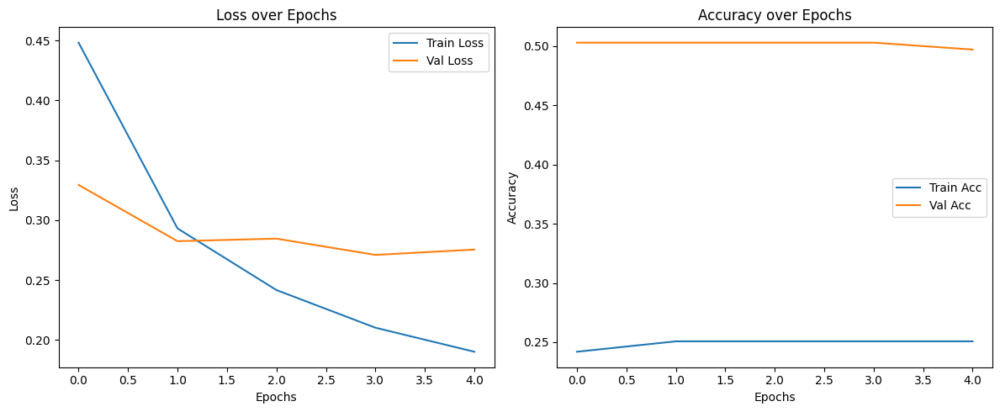

In [32]:
plt.figure(figsize=(12, 5))

plt.subplot(1, 2, 1)
plt.plot(range(num_epochs), train_losses, label='Train Loss')
plt.plot(range(num_epochs), val_losses, label='Val Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Loss over Epochs')
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(range(num_epochs), train_accs, label='Train Acc')
plt.plot(range(num_epochs), val_accs, label='Val Acc')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.title('Accuracy over Epochs')
plt.legend()

plt.tight_layout()
plt.show()

<ipython-input-33-16eaa2b6d72c>:13: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load("face_mask_detector.pth"))


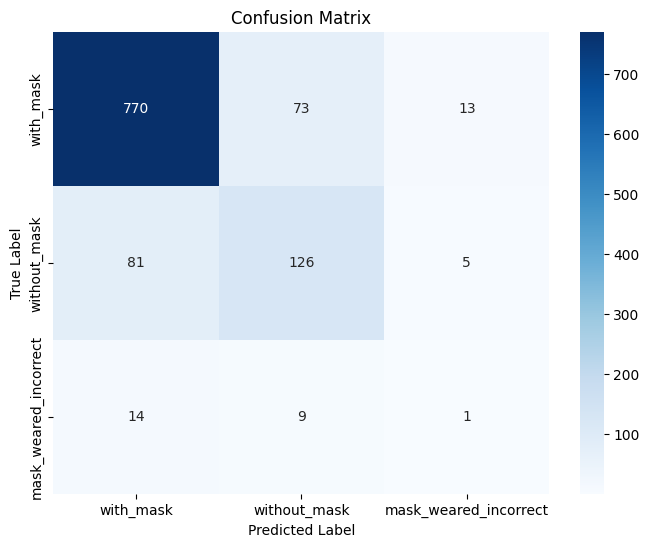

In [33]:
import torch
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
from sklearn.metrics import confusion_matrix
# from dataset import MaskDataset
from torch.utils.data import DataLoader



# Load trained model
model = get_model(4).to(device)
model.load_state_dict(torch.load("face_mask_detector.pth"))
model.eval()

# Dataset for validation
dataset = MaskDataset(path_image,path_annotations)
_, val_ds = torch.utils.data.random_split(dataset, [int(0.8*len(dataset)), len(dataset)-int(0.8*len(dataset))])
val_loader = DataLoader(val_ds, batch_size=1, shuffle=False, collate_fn=lambda x: tuple(zip(*x)))

true_labels = []
pred_labels = []

label_map = {1:'with_mask', 2:'without_mask', 3:'mask_weared_incorrect'}

with torch.no_grad():
    for imgs, targets in val_loader:
        imgs = [img.to(device) for img in imgs]
        targets = [{k: v.to(device) for k, v in t.items()} for t in targets]

        predictions = model(imgs)

        pred_classes = predictions[0]['labels'].cpu().numpy()
        true_classes = targets[0]['labels'].cpu().numpy()

        # Extend lists (simplification: comparing available labels)
        min_len = min(len(pred_classes), len(true_classes))
        true_labels.extend(true_classes[:min_len])
        pred_labels.extend(pred_classes[:min_len])

# Compute confusion matrix
cm = confusion_matrix(true_labels, pred_labels, labels=[1,2,3])

# Plot confusion matrix
plt.figure(figsize=(8,6))
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues",
            xticklabels=[label_map[i] for i in [1,2,3]],
            yticklabels=[label_map[i] for i in [1,2,3]])

plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.title('Confusion Matrix')
plt.show()


/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=FasterRCNN_ResNet50_FPN_Weights.COCO_V1`. You can also use `weights=FasterRCNN_ResNet50_FPN_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
<ipython-input-34-50ed2f4d17e5>:18: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrust

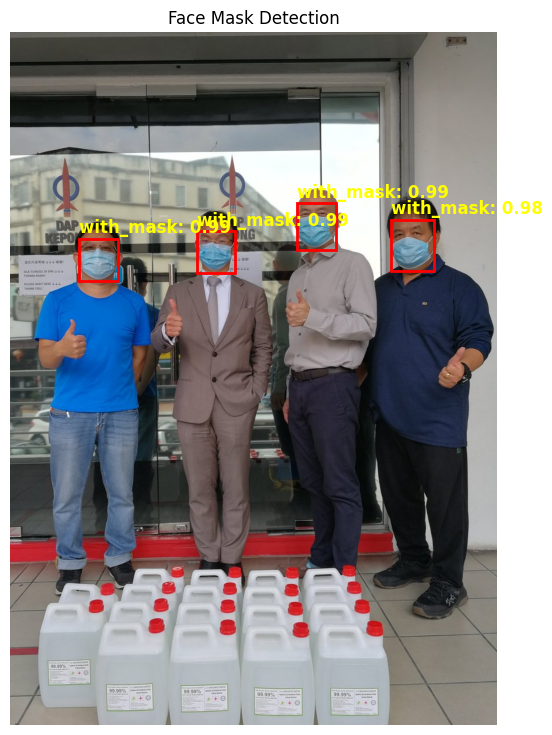

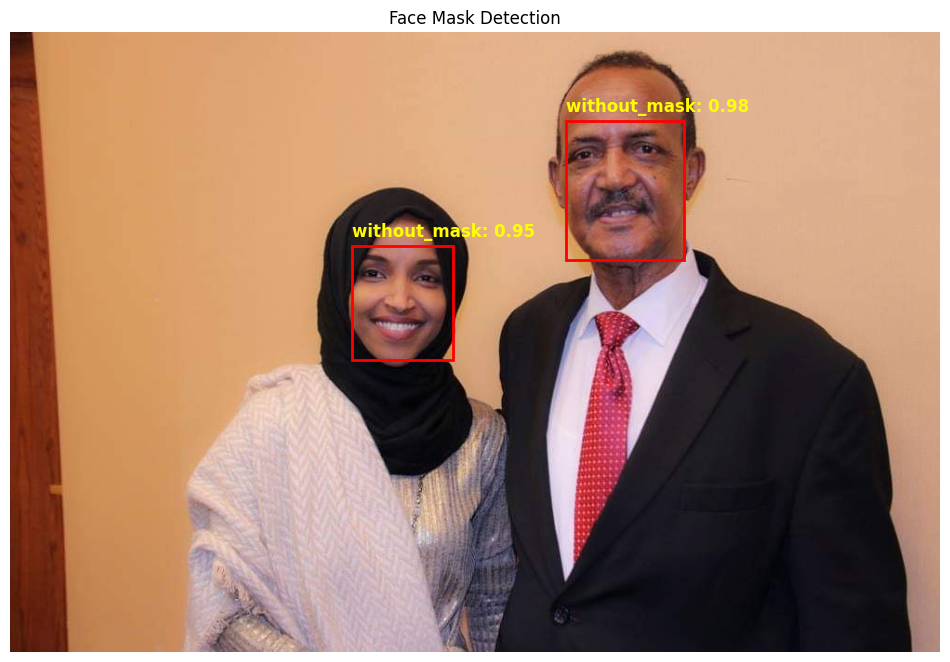

In [34]:
import torch
import torchvision
from torchvision.models.detection.faster_rcnn import FastRCNNPredictor
import cv2
import matplotlib.pyplot as plt
import matplotlib.patches as patches

# # Define model loader
# def get_model(num_classes):
#     model = torchvision.models.detection.fasterrcnn_resnet101_fpn(weights=None)
#     in_features = model.roi_heads.box_predictor.cls_score.in_features
#     model.roi_heads.box_predictor = FastRCNNPredictor(in_features, num_classes)
#     return model

# Load trained weights
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model = get_model(4).to(device)
model.load_state_dict(torch.load("face_mask_detector.pth", map_location=device))
model.eval()

# Prediction function
def predict_and_plot(image_path, threshold=0.7):
    img = cv2.imread(image_path)
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    img_tensor = torch.from_numpy(img_rgb / 255.).permute(2,0,1).float().unsqueeze(0).to(device)

    with torch.no_grad():
        prediction = model(img_tensor)[0]

    labels_map = {1:'with_mask', 2:'without_mask', 0:'mask_weared_incorrect'}

    plt.figure(figsize=(12,9))
    plt.imshow(img_rgb)

    for box, label, score in zip(prediction['boxes'], prediction['labels'], prediction['scores']):
        if score >= threshold:
            xmin, ymin, xmax, ymax = box.cpu().numpy()
            rect = patches.Rectangle((xmin, ymin), xmax-xmin, ymax-ymin,
                                     linewidth=2, edgecolor='red', facecolor='none')
            plt.gca().add_patch(rect)
            plt.text(xmin, ymin-10, f'{labels_map[label.item()]}: {score:.2f}',
                     color='yellow', fontsize=12, weight='bold')

    plt.axis('off')
    plt.title("Face Mask Detection")
    plt.show()

# Example usage:

predict_and_plot("/kaggle/input/biswas-testing/Eas1jyVXkAA0qAA.jpg")
# predict_and_plot("/kaggle/input/biswas-testing-2/EamgB23UEAEVBro.jpg")
predict_and_plot("/kaggle/input/biswas-testing-2/EamuLn5XsAAE1OX.jpg")

# Face Mask Detection Using YOLO

In [35]:
import numpy as np 
import pandas as pd 
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import seaborn as sns
from collections import Counter
import os

import torch
from torchvision import datasets, transforms, models
from torch.utils.data import Dataset, DataLoader
from PIL import Image

import sys
import torch.optim as optim
import torch.nn as nn
import torch.nn.functional as F
import time
import copy
from tqdm import tqdm
from sklearn.metrics import classification_report, confusion_matrix
import os
import shutil
import xml.etree.ElementTree as ET
import random

In [36]:
!pip install xmltodict
import xmltodict
!pip install ultralytics


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 976.9/976.9 kB 43.3 MB/s eta 0:00:00


## Data Preprocessing For YOLO

In [87]:
source_folder="/kaggle/input/face-mask-detection"
dataset_path = "face-mask-detection"
os.makedirs(dataset_path, exist_ok=True)

In [88]:
# Create the destination folder if it doesn't exist
os.makedirs(dataset_path, exist_ok=True)

# List the subfolders inside the source folder that we want to process
subfolders = ["annotations", "images"]

# Iterate through the subfolders and copy their files to the destination folder
for subfolder in subfolders:
    subfolder_path = os.path.join(source_folder, subfolder)
    if os.path.exists(subfolder_path):  # Check if the subfolder exists
        for filename in os.listdir(subfolder_path):  # List all files in the subfolder
            file_path = os.path.join(subfolder_path, filename)
            if os.path.isfile(file_path):  # Make sure it's a file, not a directory
                shutil.copy(file_path, dataset_path)  # Copy the file to the destination folder

print(f"All files have been copied to the folder '{dataset_path}' successfully.")


All files have been copied to the folder 'face-mask-detection' successfully.


In [89]:


# dataset_path = "/root/face-mask-detection" # Updated to match your folder structure

# Define classes and their IDs
classes = {"without_mask": 0, "with_mask": 1, "mask_weared_incorrect": 2}

for xml_file in os.listdir(dataset_path):
    if not xml_file.endswith(".xml"):  # Only process XML files
        continue

    tree = ET.parse(os.path.join(dataset_path, xml_file))
    root = tree.getroot()

    # Get image dimensions
    size = root.find("size")
    img_width = int(size.find("width").text)
    img_height = int(size.find("height").text)

    # Create a txt file inside the same folder
    txt_filename = os.path.splitext(xml_file)[0] + ".txt"
    with open(os.path.join(dataset_path, txt_filename), "w") as f:
        for obj in root.iter("object"):
            cls = obj.find("name").text
            cls_id = classes.get(cls, -1)  # Handle unknown classes safely

            if cls_id == -1:
                continue  # Skip if the class is not recognized

            # Get bounding box coordinates
            bbox = obj.find("bndbox")
            xmin = int(bbox.find("xmin").text)
            ymin = int(bbox.find("ymin").text)
            xmax = int(bbox.find("xmax").text)
            ymax = int(bbox.find("ymax").text)

            # Calculate normalized coordinates
            x_center = (xmin + xmax) / (2 * img_width)
            y_center = (ymin + ymax) / (2 * img_height)
            width = (xmax - xmin) / img_width
            height = (ymax - ymin) / img_height

            # Write to txt file
            f.write(f"{cls_id} {x_center} {y_center} {width} {height}\n")

print("Text files created successfully in the 'face-mask-detection' folder.")


Text files created successfully in the 'face-mask-detection' folder.


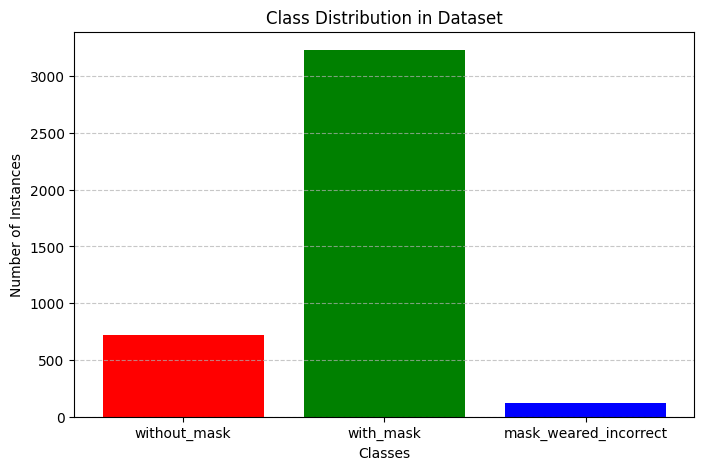

In [90]:
class_count = {"without_mask": 0, "with_mask": 0, "mask_weared_incorrect": 0}

# Iterate through all text files in the dataset folder
for txt_file in os.listdir(dataset_path):
    if txt_file.endswith(".txt"):  # Process only text files
        with open(os.path.join(dataset_path, txt_file), "r") as f:
            for line in f:
                parts = line.strip().split()
                if parts:  # Ensure the line is not empty
                    class_id = int(parts[0])
                    class_name = list(class_count.keys())[class_id]
                    class_count[class_name] += 1

# Plot the class distribution
plt.figure(figsize=(8, 5))  # Set figure size
plt.bar(class_count.keys(), class_count.values(), color=['red', 'green', 'blue'])
plt.title("Class Distribution in Dataset")
plt.xlabel("Classes")
plt.ylabel("Number of Instances")
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()

In [91]:
total = sum(class_count.values())
#Calculate the proportions using a comprehension and round it up
class_count_proportion = {key: round((value / total)*100, 0) for key, value in class_count.items()}

class_count_proportion

{'without_mask': 18.0, 'with_mask': 79.0, 'mask_weared_incorrect': 3.0}

In [92]:
#Part 1: Identify images with minority classes
#Create a list for minority classes
min_class0_img = []
min_class2_img = []


for txt_file in os.listdir(dataset_path):
    if not txt_file.endswith(".txt"):
        continue
    with open (os.path.join(dataset_path, txt_file), "r") as f:
        lines = f.readlines()
        classes_in_image = set()
        for line in lines:
            class_id = int(line.split()[0])
            classes_in_image.add(class_id)
        #Check if it contains minority classes
        if 0 in classes_in_image:
            min_class0_img.append(txt_file.replace(".txt", ".png"))
        if 2 in classes_in_image:
            min_class2_img.append(txt_file.replace(".txt", ".png"))

In [93]:
#Check if the lists with minority classes is created
len(min_class0_img), len(min_class2_img)
print(min_class2_img)

['maksssksksss673.png', 'maksssksksss424.png', 'maksssksksss824.png', 'maksssksksss741.png', 'maksssksksss272.png', 'maksssksksss496.png', 'maksssksksss659.png', 'maksssksksss545.png', 'maksssksksss835.png', 'maksssksksss13.png', 'maksssksksss173.png', 'maksssksksss748.png', 'maksssksksss130.png', 'maksssksksss206.png', 'maksssksksss498.png', 'maksssksksss428.png', 'maksssksksss484.png', 'maksssksksss387.png', 'maksssksksss566.png', 'maksssksksss2.png', 'maksssksksss495.png', 'maksssksksss250.png', 'maksssksksss786.png', 'maksssksksss717.png', 'maksssksksss611.png', 'maksssksksss760.png', 'maksssksksss145.png', 'maksssksksss431.png', 'maksssksksss657.png', 'maksssksksss371.png', 'maksssksksss737.png', 'maksssksksss613.png', 'maksssksksss627.png', 'maksssksksss255.png', 'maksssksksss603.png', 'maksssksksss9.png', 'maksssksksss331.png', 'maksssksksss634.png', 'maksssksksss832.png', 'maksssksksss52.png', 'maksssksksss29.png', 'maksssksksss11.png', 'maksssksksss132.png', 'maksssksksss199.p

In [94]:
repeated = list(set(min_class0_img) & set(min_class2_img))
len(repeated)

46

### Split Dataset into Train and Test

In [95]:
import random
import os

random.seed(42)

# New ratios
train_ratio = 0.7
val_ratio = 0.15
test_ratio = 0.15

# Exclude repeated images from both minority lists
min_class0_img = list(set(min_class0_img) - set(repeated))
min_class2_img = list(set(min_class2_img) - set(repeated))

# Split without_mask (0)
random.shuffle(min_class0_img)
train_class0 = min_class0_img[:int(train_ratio * len(min_class0_img))]
val_class0 = min_class0_img[int(train_ratio * len(min_class0_img)) : int((train_ratio + val_ratio) * len(min_class0_img))]
test_class0 = min_class0_img[int((train_ratio + val_ratio) * len(min_class0_img)) :]

# Split mask_weared_incorrect (2)
random.shuffle(min_class2_img)
train_class2 = min_class2_img[:int(train_ratio * len(min_class2_img))]
val_class2 = min_class2_img[int(train_ratio * len(min_class2_img)) : int((train_ratio + val_ratio) * len(min_class2_img))]
test_class2 = min_class2_img[int((train_ratio + val_ratio) * len(min_class2_img)) :]

# Split the shared images by ratios
random.shuffle(repeated)
train_shared = repeated[:int(train_ratio * len(repeated))]
val_shared = repeated[int(train_ratio * len(repeated)) : int((train_ratio + val_ratio) * len(repeated))]
test_shared = repeated[int((train_ratio + val_ratio) * len(repeated)) :]

# Obtain all images from the dataset folder
all_images = [file.replace(".xml", ".png") for file in os.listdir(dataset_path) if file.endswith(".xml")]

# Images of the majority class (1)
majority_images = list(set(all_images) - set(min_class0_img) - set(min_class2_img) - set(repeated))

# Divide majority class images according to ratios
random.shuffle(majority_images)
train_majority = majority_images[:int(train_ratio * len(majority_images))]
val_majority = majority_images[int(train_ratio * len(majority_images)) : int((train_ratio + val_ratio) * len(majority_images))]
test_majority = majority_images[int((train_ratio + val_ratio) * len(majority_images)) :]

# Finally, combine all the splits
train_split = train_class0 + train_class2 + train_shared + train_majority
val_split = val_class0 + val_class2 + val_shared + val_majority
test_split = test_class0 + test_class2 + test_shared + test_majority


In [96]:
len(train_split), len(test_split), len(val_split)


(596, 129, 128)

### Data Loaders

In [97]:
import os
import shutil
output_dir = "face-mask-detection-stratified"
train_dir = os.path.join(output_dir, "train")
val_dir = os.path.join(output_dir, "val")
test_dir = os.path.join(output_dir, "test")
os.makedirs(output_dir, exist_ok=True)
# Create the folders
os.makedirs(train_dir, exist_ok=True)
os.makedirs(val_dir, exist_ok=True)
os.makedirs(test_dir, exist_ok=True)

# Create a function for copying images and annotations to a specific folder
def copy_files(file_list, dest_dir, src_dir):
    for file in file_list:
        # Copy images
        image_path = os.path.join(src_dir, file)  # Image path
        shutil.copy(image_path, os.path.join(dest_dir, file))

        # Copy the annotations of the images
        annot_file = file.replace(".png", ".txt")
        annot_path = os.path.join(src_dir, annot_file)  # Annotation path
        shutil.copy(annot_path, os.path.join(dest_dir, annot_file))

# Path where the images and annotations are
#  = "/root/face-mask-detection"

# Copy train split
copy_files(train_split, train_dir, dataset_path)

# Copy val split
copy_files(val_split, val_dir, dataset_path)

# Copy test split
copy_files(test_split, test_dir, dataset_path)

print("Train, val, and test splits have been created in --> /" + str(output_dir))

Train, val, and test splits have been created in --> /face-mask-detection-stratified


In [98]:
# Create the yaml file
yaml_file_path = "dataset_config.yaml"
data = """
path: "/kaggle/working/face-mask-detection-stratified"
train: train
val: val
test: test

names:
  1: with_mask
  0: without_mask
  2: mask_weared_incorrect
"""

with open(yaml_file_path, "w") as file:
    file.write(data)

print(f"Train, val, and test splits have been created in --> /{output_dir}")
print(f".yaml file created in: {yaml_file_path}")

Train, val, and test splits have been created in --> /face-mask-detection-stratified
.yaml file created in: dataset_config.yaml


In [99]:
import torch
print(torch.cuda.is_available())  # Should return True if CUDA is available
print(torch.cuda.device_count())  # Should be >0 if a GPU is detected
print(torch.version.cuda)  # Check CUDA version


True
1
12.1


In [100]:
from ultralytics import YOLO
import torch
import os

# Load the base model
model = YOLO("yolov8n.pt")
data_config = "/kaggle/working/dataset_config.yaml"
# Train and save the model
results = model.train(
    data=data_config,
    epochs=15,
    imgsz=640,
    batch=8,
    device="cuda",
    save=True  # This saves the best model in runs/detect/train/weights/best.pt
)



Ultralytics 8.3.99 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla P100-PCIE-16GB, 16269MiB)
engine/trainer: task=detect, mode=train, model=yolov8n.pt, data=/kaggle/working/dataset_config.yaml, epochs=15, time=None, patience=100, batch=8, imgsz=640, save=True, save_period=-1, cache=False, device=cuda, workers=8, project=None, name=train2, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_

/usr/local/lib/python3.10/dist-packages/ultralytics/utils/torch_utils.py:260: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at ../aten/src/ATen/Context.cpp:208.)
  fusedconv.weight.copy_(torch.mm(w_bn, w_conv).view(fusedconv.weight.shape))
/usr/local/lib/python3.10/dist-packages/ultralytics/utils/torch_utils.py:265: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operati

AMP: checks passed ✅


/usr/local/lib/python3.10/dist-packages/ultralytics/nn/modules/block.py:1323: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at ../aten/src/ATen/Context.cpp:208.)
  attn = (q.transpose(-2, -1) @ k) * self.scale
/usr/local/lib/python3.10/dist-packages/ultralytics/nn/modules/block.py:1325: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic becaus

albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))



val: Scanning /kaggle/working/face-mask-detection-stratified/val.cache... 128 images, 0 backgrounds, 0 corrupt: 100%|██████████| 128/128 [00:00<?, ?it/s]


Plotting labels to runs/detect/train2/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.001429, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 4 dataloader workers
Logging results to runs/detect/train2
Starting training for 15 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/75 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/ultralytics/utils/loss.py:196: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at ../aten/src/ATen/Context.cpp:208.)
  pred_dist = pred_dist.view(b, a, 4, c // 4).softmax(3).matmul(self.proj.type(pred_dist.dtype))
       1/15       2.3G      1.659       2.58       1.37         25        640: 100%|██████████| 75/75 [00:09<00:00,  7.61it/s]
                 Class     Images  Instances      Box(P          R      

                   all        128        590      0.969      0.122      0.263      0.145



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/75 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/ultralytics/utils/loss.py:196: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at ../aten/src/ATen/Context.cpp:208.)
  pred_dist = pred_dist.view(b, a, 4, c // 4).softmax(3).matmul(self.proj.type(pred_dist.dtype))
       2/15       2.3G      1.315      1.411      1.118         11        640: 100%|██████████| 75/75 [00:09<00:00,  7.84it/s]
                 Class     Images  Instances      Box(P          R      

                   all        128        590      0.812      0.377       0.46      0.287



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/75 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/ultralytics/utils/loss.py:196: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at ../aten/src/ATen/Context.cpp:208.)
  pred_dist = pred_dist.view(b, a, 4, c // 4).softmax(3).matmul(self.proj.type(pred_dist.dtype))
       3/15       2.3G      1.276      1.264      1.096         33        640: 100%|██████████| 75/75 [00:09<00:00,  8.17it/s]
                 Class     Images  Instances      Box(P          R      

                   all        128        590      0.562      0.438      0.492        0.3



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/75 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/ultralytics/utils/loss.py:196: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at ../aten/src/ATen/Context.cpp:208.)
  pred_dist = pred_dist.view(b, a, 4, c // 4).softmax(3).matmul(self.proj.type(pred_dist.dtype))
       4/15       2.3G      1.211      1.135      1.091         48        640: 100%|██████████| 75/75 [00:09<00:00,  8.28it/s]
                 Class     Images  Instances      Box(P          R      

                   all        128        590      0.561      0.543      0.563      0.352



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/75 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/ultralytics/utils/loss.py:196: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at ../aten/src/ATen/Context.cpp:208.)
  pred_dist = pred_dist.view(b, a, 4, c // 4).softmax(3).matmul(self.proj.type(pred_dist.dtype))
       5/15       2.3G      1.222      1.045      1.089         26        640: 100%|██████████| 75/75 [00:09<00:00,  7.98it/s]
                 Class     Images  Instances      Box(P          R      

                   all        128        590       0.69      0.541      0.601      0.366


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/75 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/ultralytics/utils/loss.py:196: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at ../aten/src/ATen/Context.cpp:208.)
  pred_dist = pred_dist.view(b, a, 4, c // 4).softmax(3).matmul(self.proj.type(pred_dist.dtype))
       6/15       2.3G       1.17      1.135      1.084          6        640: 100%|██████████| 75/75 [00:09<00:00,  7.73it/s]
                 Class     Images  Instances      Box(P          R      

                   all        128        590       0.69      0.544      0.595      0.362



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/75 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/ultralytics/utils/loss.py:196: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at ../aten/src/ATen/Context.cpp:208.)
  pred_dist = pred_dist.view(b, a, 4, c // 4).softmax(3).matmul(self.proj.type(pred_dist.dtype))
       7/15       2.3G      1.177      1.012       1.08          6        640: 100%|██████████| 75/75 [00:08<00:00,  8.37it/s]
                 Class     Images  Instances      Box(P          R      

                   all        128        590      0.787      0.498      0.571      0.351

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/75 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/ultralytics/utils/loss.py:196: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at ../aten/src/ATen/Context.cpp:208.)
  pred_dist = pred_dist.view(b, a, 4, c // 4).softmax(3).matmul(self.proj.type(pred_dist.dtype))
       8/15       2.3G      1.125     0.9391       1.06         29        640: 100%|██████████| 75/75 [00:09<00:00,  8.13it/s]
                 Class     Images  Instances      Box(P          R      

                   all        128        590      0.707      0.539      0.597      0.373



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/75 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/ultralytics/utils/loss.py:196: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at ../aten/src/ATen/Context.cpp:208.)
  pred_dist = pred_dist.view(b, a, 4, c // 4).softmax(3).matmul(self.proj.type(pred_dist.dtype))
       9/15       2.3G      1.132     0.8875      1.057          8        640: 100%|██████████| 75/75 [00:08<00:00,  8.37it/s]
                 Class     Images  Instances      Box(P          R      

                   all        128        590      0.641      0.567      0.632      0.398



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/75 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/ultralytics/utils/loss.py:196: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at ../aten/src/ATen/Context.cpp:208.)
  pred_dist = pred_dist.view(b, a, 4, c // 4).softmax(3).matmul(self.proj.type(pred_dist.dtype))
      10/15       2.3G      1.104     0.8455      1.045         17        640: 100%|██████████| 75/75 [00:08<00:00,  8.35it/s]
                 Class     Images  Instances      Box(P          R      

                   all        128        590      0.745      0.637      0.663       0.43



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/75 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/ultralytics/utils/loss.py:196: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at ../aten/src/ATen/Context.cpp:208.)
  pred_dist = pred_dist.view(b, a, 4, c // 4).softmax(3).matmul(self.proj.type(pred_dist.dtype))
      11/15       2.3G      1.073     0.8011      1.035          6        640: 100%|██████████| 75/75 [00:09<00:00,  8.10it/s]
                 Class     Images  Instances      Box(P          R      

                   all        128        590      0.833      0.623      0.708      0.463



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/75 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/ultralytics/utils/loss.py:196: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at ../aten/src/ATen/Context.cpp:208.)
  pred_dist = pred_dist.view(b, a, 4, c // 4).softmax(3).matmul(self.proj.type(pred_dist.dtype))
      12/15       2.3G      1.082     0.7693      1.019         26        640: 100%|██████████| 75/75 [00:08<00:00,  8.41it/s]
                 Class     Images  Instances      Box(P          R      

                   all        128        590      0.602      0.659      0.675      0.431



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/75 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/ultralytics/utils/loss.py:196: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at ../aten/src/ATen/Context.cpp:208.)
  pred_dist = pred_dist.view(b, a, 4, c // 4).softmax(3).matmul(self.proj.type(pred_dist.dtype))
      13/15       2.3G      1.041     0.7443      1.007         18        640: 100%|██████████| 75/75 [00:08<00:00,  8.37it/s]
                 Class     Images  Instances      Box(P          R      

                   all        128        590      0.797      0.628      0.715      0.487



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/75 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/ultralytics/utils/loss.py:196: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at ../aten/src/ATen/Context.cpp:208.)
  pred_dist = pred_dist.view(b, a, 4, c // 4).softmax(3).matmul(self.proj.type(pred_dist.dtype))
      14/15       2.3G      1.024     0.7047      0.991          7        640: 100%|██████████| 75/75 [00:09<00:00,  8.24it/s]
                 Class     Images  Instances      Box(P          R      

                   all        128        590      0.882      0.649      0.747      0.499



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/75 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/ultralytics/utils/loss.py:196: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at ../aten/src/ATen/Context.cpp:208.)
  pred_dist = pred_dist.view(b, a, 4, c // 4).softmax(3).matmul(self.proj.type(pred_dist.dtype))
      15/15       2.3G      1.021     0.6983     0.9977         56        640: 100%|██████████| 75/75 [00:09<00:00,  8.32it/s]
                 Class     Images  Instances      Box(P          R      

                   all        128        590      0.817      0.689      0.752      0.506



15 epochs completed in 0.045 hours.
Optimizer stripped from runs/detect/train2/weights/last.pt, 6.2MB
Optimizer stripped from runs/detect/train2/weights/best.pt, 6.2MB

Validating runs/detect/train2/weights/best.pt...
Ultralytics 8.3.99 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla P100-PCIE-16GB, 16269MiB)
Model summary (fused): 72 layers, 3,006,233 parameters, 0 gradients, 8.1 GFLOPs


/usr/local/lib/python3.10/dist-packages/ultralytics/utils/torch_utils.py:260: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at ../aten/src/ATen/Context.cpp:208.)
  fusedconv.weight.copy_(torch.mm(w_bn, w_conv).view(fusedconv.weight.shape))
/usr/local/lib/python3.10/dist-packages/ultralytics/utils/torch_utils.py:265: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operati

                   all        128        590      0.816      0.689      0.752      0.503
          without_mask         43        120       0.75      0.701      0.771      0.466
             with_mask        115        452      0.896      0.865      0.926      0.627
 mask_weared_incorrect         15         18      0.802        0.5      0.559      0.417


/usr/local/lib/python3.10/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1
/usr/local/lib/python3.10/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1


Speed: 0.2ms preprocess, 2.6ms inference, 0.0ms loss, 1.3ms postprocess per image
Results saved to runs/detect/train2


In [101]:
# Get the path to the best model
best_model_path = os.path.join(model.trainer.save_dir, "weights", "best.pt")

# Load the trained model to extract information1
trained_model = YOLO(best_model_path)

# Save complete model with metadata
model_info = {
    'model_type': 'YOLOv8n',
    'model_path': best_model_path,
    'task': 'detection',
    'hyperparameters': {
        'epochs': 15,
        'img_size': 640,
        'batch_size': 8,
        'dataset': data_config,
    },
    # Adding a reference to original weights location
    'original_weights_path': best_model_path
}

# Save the model info and create a copy of the model
torch.save(model_info, 'face_mask_yolo_model.pth')
print("Model metadata saved as 'face_mask_yolo_model.pth'")

# Copy the actual model for deployment
import shutil
shutil.copy(best_model_path, 'face_mask_yolo_weights.pth')
print(f"Model weights saved as 'face_mask_yolo_weights.pth'")

Model metadata saved as 'face_mask_yolo_model.pth'
Model weights saved as 'face_mask_yolo_weights.pth'


In [102]:
import os
import torch
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from ultralytics import YOLO
from sklearn.metrics import precision_score, recall_score, f1_score, confusion_matrix

# Load the trained YOLO model
# model = YOLO("yolov5s.pt")  # Use your trained model path

# Define dataset paths
dataset_path = "face-mask-detection-stratified"
test_path = os.path.join(dataset_path, "test")
labels_path = os.path.join(dataset_path, "test")  # Path to ground truth labels

# Function to get ground truth labels
def get_ground_truth_labels(image_name):
    label_file = os.path.join(labels_path, image_name.replace(".png", ".txt"))
    if not os.path.exists(label_file):
        return set()  # Return empty set if no labels exist

    with open(label_file, "r") as file:
        labels = set(int(line.split()[0]) for line in file.readlines())  # Unique class labels
    return labels

# Function to get predictions from YOLO model
def get_predictions(image_path):
    results = model(image_path)
    pred_classes = set(results[0].boxes.cls.cpu().numpy().astype(int))  # Convert to unique set
    return pred_classes

# Metrics variables
total_precision, total_recall, total_f1 = [], [], []

# Process each image
for img in os.listdir(test_path):
    if img.endswith(".png"):
        img_path = os.path.join(test_path, img)

        # Get labels
        gt_labels = get_ground_truth_labels(img)
        pred_labels = get_predictions(img_path)

        if gt_labels:  # Ignore images without ground truth
            # Compute per-image precision, recall, and F1-score
            intersection = len(gt_labels & pred_labels)  # Correctly detected labels
            precision = intersection / len(pred_labels) if pred_labels else 0  # Avoid division by zero
            recall = intersection / len(gt_labels)
            f1 = (2 * precision * recall) / (precision + recall) if (precision + recall) > 0 else 0

            total_precision.append(precision)
            total_recall.append(recall)
            total_f1.append(f1)

# Compute final evaluation metrics
avg_precision = np.mean(total_precision)
avg_recall = np.mean(total_recall)
avg_f1 = np.mean(total_f1)

print(f" Precision: {avg_precision:.4f}")
print(f" Recall: {avg_recall:.4f}")
print(f" F1-Score: {avg_f1:.4f}")



image 1/1 /kaggle/working/face-mask-detection-stratified/test/maksssksksss690.png: 416x640 2 without_masks, 18 with_masks, 6.7ms
Speed: 1.7ms preprocess, 6.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)

image 1/1 /kaggle/working/face-mask-detection-stratified/test/maksssksksss311.png: 416x640 5 with_masks, 5.8ms
Speed: 1.4ms preprocess, 5.8ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 640)

image 1/1 /kaggle/working/face-mask-detection-stratified/test/maksssksksss156.png: 448x640 6 without_masks, 6 with_masks, 1 mask_weared_incorrect, 6.6ms
Speed: 1.5ms preprocess, 6.6ms inference, 1.0ms postprocess per image at shape (1, 3, 448, 640)

image 1/1 /kaggle/working/face-mask-detection-stratified/test/maksssksksss49.png: 384x640 1 without_mask, 7 with_masks, 7.6ms
Speed: 1.3ms preprocess, 7.6ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/face-mask-detection-stratified/test/maksssksksss718.png: 448x640 2

In [103]:
import shutil
shutil.copy("/kaggle/working/runs/detect/train/weights/best.pt", "yolo_v8.pt")


'yolo_v8.pt'

In [104]:


# Load the trained model
trained_model_v8 = YOLO("/kaggle/working/yolo_v8.pt")

def draw_inference_wBoxes(src_image):
    results = trained_model_v8(src_image)  # Run inference on image
    results_img = results[0].plot()  # Draw bounding boxes

    # Display image with bounding boxes
    plt.imshow(cv2.cvtColor(results_img, cv2.COLOR_BGR2RGB))
    plt.axis("off")
    plt.show()





image 1/1 /kaggle/input/karantesting/Udaipur.jpg: 480x640 5 without_masks, 1 with_mask, 7.1ms
Speed: 2.9ms preprocess, 7.1ms inference, 1.2ms postprocess per image at shape (1, 3, 480, 640)


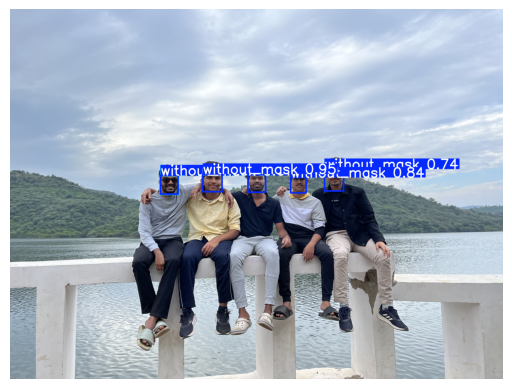

In [105]:
img = "/kaggle/input/karantesting/Udaipur.jpg"
draw_inference_wBoxes(img)


image 1/1 /kaggle/input/karantesting/IMGL6139.JPG: 448x640 4 without_masks, 1 with_mask, 7.5ms
Speed: 3.1ms preprocess, 7.5ms inference, 1.4ms postprocess per image at shape (1, 3, 448, 640)


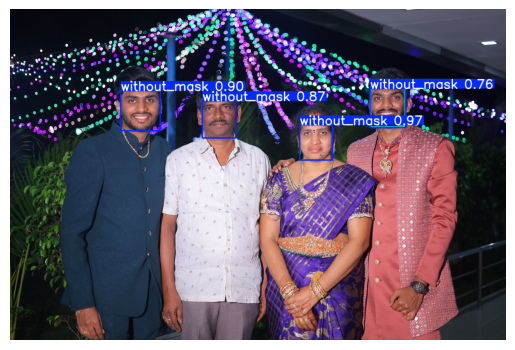

In [106]:
img = "/kaggle/input/karantesting/IMGL6139.JPG"
draw_inference_wBoxes(img)


image 1/1 /kaggle/input/bafmd-timepass/EateOBVUEAALop2.jpg: 480x640 2 with_masks, 7.1ms
Speed: 2.4ms preprocess, 7.1ms inference, 1.7ms postprocess per image at shape (1, 3, 480, 640)


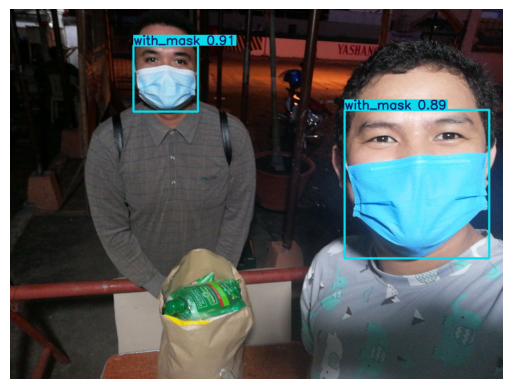

In [107]:
img = "/kaggle/input/bafmd-timepass/EateOBVUEAALop2.jpg"
draw_inference_wBoxes(img)


image 1/1 /kaggle/input/bafmd-timepass/EaxjTXyVAAUddz8.jpg: 384x640 5 with_masks, 7.7ms
Speed: 2.8ms preprocess, 7.7ms inference, 1.2ms postprocess per image at shape (1, 3, 384, 640)


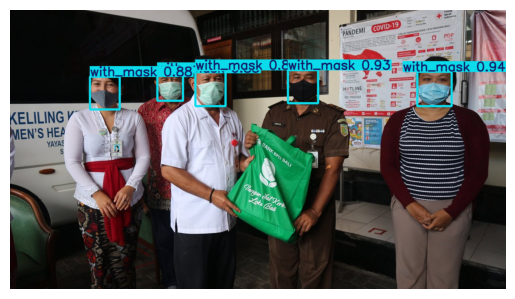

In [108]:
img = "/kaggle/input/bafmd-timepass/EaxjTXyVAAUddz8.jpg"
draw_inference_wBoxes(img)


image 1/1 /kaggle/input/bafmd-timepass/Eb0hX0tVAAAyOJI.jpg: 512x640 1 with_mask, 1 mask_weared_incorrect, 7.3ms
Speed: 2.5ms preprocess, 7.3ms inference, 1.2ms postprocess per image at shape (1, 3, 512, 640)


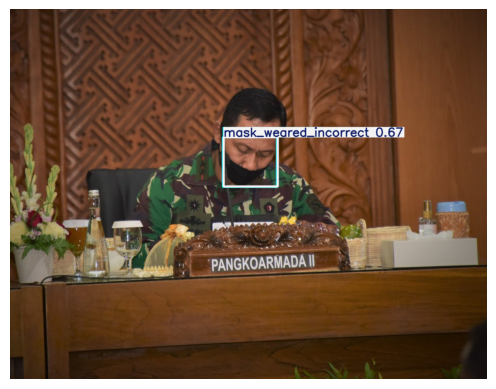

In [109]:
img = "/kaggle/input/bafmd-timepass/Eb0hX0tVAAAyOJI.jpg"
draw_inference_wBoxes(img)


image 1/1 /kaggle/input/biswas-testing-2/bis2.jpg: 640x384 1 without_mask, 1 mask_weared_incorrect, 7.2ms
Speed: 1.9ms preprocess, 7.2ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 384)


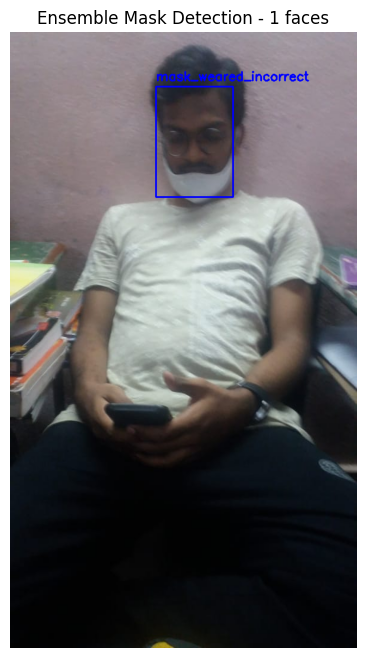

In [111]:
import torch
import cv2
import numpy as np
from PIL import Image
from collections import Counter
from ultralytics import YOLO
import matplotlib.pyplot as plt
import torch.nn.functional as F


# Predict class using ensemble voting
def ensemble_predict(face_image, resnet50_model, resnet18_model, yolo_class=None, device=None):
    if device is None:
        device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

    # Get predictions from ResNet50 and ResNet18
    pred_resnet50, _ = predict_mask(face_image, resnet50_model, device=device)
    pred_resnet18, _ = predict_mask(face_image, resnet18_model, device=device)

    # Collect predictions
    predictions = [pred_resnet50, pred_resnet18]

    # Add YOLO prediction if available
    if yolo_class is not None:
        predictions.append(yolo_class)

    # Majority voting
    vote_counts = Counter(predictions)
    top_votes = vote_counts.most_common()

    # Resolve ties by prioritizing YOLO prediction
    if len(top_votes) > 1 and top_votes[0][1] == top_votes[1][1] and yolo_class:
        final_prediction = yolo_class
    else:
        final_prediction = top_votes[0][0]

    return final_prediction


# Main function for detection and ensemble classification
def detect_and_ensemble(image_path, resnet50_model, resnet18_model, yolo_model_path, show_image=True):
    if not os.path.isfile(image_path):
        print(f"Image '{image_path}' not found.")
        return

    img = cv2.imread(image_path)
    if img is None:
        print(f"Error loading image '{image_path}'.")
        return

    model_file = "res10_300x300_ssd_iter_140000.caffemodel"
    config_file = "deploy.prototxt"

    if not (os.path.isfile(model_file) and os.path.isfile(config_file)):
        if not download_dnn_models():
            return

    net = cv2.dnn.readNetFromCaffe(config_file, model_file)
    (h, w) = img.shape[:2]

    blob = cv2.dnn.blobFromImage(cv2.resize(img, (300, 300)), 1.0,
                                 (300, 300), (104.0, 177.0, 123.0))
    net.setInput(blob)
    detections = net.forward()

    # Load YOLO model
    yolo_model = YOLO(yolo_model_path)
    yolo_results = yolo_model(image_path)
    yolo_predictions = [yolo_model.names[int(det.cls)] for det in yolo_results[0].boxes]

    face_count = 0
    for i in range(detections.shape[2]):
        confidence = detections[0, 0, i, 2]
        if confidence > 0.25:
            face_count += 1
            box = detections[0, 0, i, 3:7] * np.array([w, h, w, h])
            (startX, startY, endX, endY) = box.astype("int")

            startX, startY = max(0, startX), max(0, startY)
            endX, endY = min(w - 1, endX), min(h - 1, endY)

            face_roi = img[startY:endY, startX:endX]
            if face_roi.size == 0:
                continue

            face_image = Image.fromarray(cv2.cvtColor(face_roi, cv2.COLOR_BGR2RGB))

            # Get corresponding YOLO prediction if available
            yolo_class = yolo_predictions[face_count - 1] if len(yolo_predictions) >= face_count else None

            final_class = ensemble_predict(face_image, resnet50_model, resnet18_model, yolo_class)

            color_map = {'with_mask': (0, 255, 0), 'without_mask': (0, 0, 255), 'mask_weared_incorrect': (255, 0, 0)}
            color = color_map.get(final_class, (255, 255, 255))

            cv2.rectangle(img, (startX, startY), (endX, endY), color, 2)
            label = f"{final_class}"
            y = startY - 10 if startY - 10 > 10 else startY + 10
            cv2.putText(img, label, (startX, y), cv2.FONT_HERSHEY_SIMPLEX, 0.7, color, 2)

    if face_count == 0:
        cv2.putText(img, "No faces detected", (50, 50), cv2.FONT_HERSHEY_SIMPLEX, 1, (0, 0, 255), 2)

    if show_image:
        img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        plt.figure(figsize=(12, 8))
        plt.imshow(img_rgb)
        plt.axis('off')
        plt.title(f"Ensemble Mask Detection - {face_count} faces")
        plt.show()

# Usage example (ensure models are loaded)
detect_and_ensemble('/kaggle/input/biswas-testing-2/bis2.jpg', resnet50_model_sd, resnet18_model_sd, '/kaggle/working/yolo_v8.pt')
